# Table of Contents
 <p><div class="lev1 toc-item"><a href="#An-example-of-a-small-Multi-Player-simulation,-with-rhoRand-and-Selfish,-for-different-algorithms" data-toc-modified-id="An-example-of-a-small-Multi-Player-simulation,-with-rhoRand-and-Selfish,-for-different-algorithms-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>An example of a small Multi-Player simulation, with rhoRand and Selfish, for different algorithms</a></div><div class="lev2 toc-item"><a href="#Creating-the-problem" data-toc-modified-id="Creating-the-problem-11"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Creating the problem</a></div><div class="lev3 toc-item"><a href="#Parameters-for-the-simulation" data-toc-modified-id="Parameters-for-the-simulation-111"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Parameters for the simulation</a></div><div class="lev3 toc-item"><a href="#Three-MAB-problems-with-Bernoulli-arms" data-toc-modified-id="Three-MAB-problems-with-Bernoulli-arms-112"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>Three MAB problems with Bernoulli arms</a></div><div class="lev3 toc-item"><a href="#Some-RL-algorithms" data-toc-modified-id="Some-RL-algorithms-113"><span class="toc-item-num">1.1.3&nbsp;&nbsp;</span>Some RL algorithms</a></div><div class="lev2 toc-item"><a href="#Creating-the-EvaluatorMultiPlayers-objects" data-toc-modified-id="Creating-the-EvaluatorMultiPlayers-objects-12"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Creating the <code>EvaluatorMultiPlayers</code> objects</a></div><div class="lev2 toc-item"><a href="#Solving-the-problem" data-toc-modified-id="Solving-the-problem-13"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Solving the problem</a></div><div class="lev2 toc-item"><a href="#Plotting-the-results" data-toc-modified-id="Plotting-the-results-14"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Plotting the results</a></div><div class="lev3 toc-item"><a href="#First-problem" data-toc-modified-id="First-problem-141"><span class="toc-item-num">1.4.1&nbsp;&nbsp;</span>First problem</a></div><div class="lev3 toc-item"><a href="#Second-problem" data-toc-modified-id="Second-problem-142"><span class="toc-item-num">1.4.2&nbsp;&nbsp;</span>Second problem</a></div><div class="lev3 toc-item"><a href="#Third-problem" data-toc-modified-id="Third-problem-143"><span class="toc-item-num">1.4.3&nbsp;&nbsp;</span>Third problem</a></div><div class="lev3 toc-item"><a href="#Comparing-their-performances" data-toc-modified-id="Comparing-their-performances-144"><span class="toc-item-num">1.4.4&nbsp;&nbsp;</span>Comparing their performances</a></div>

---
# An example of a small Multi-Player simulation, with rhoRand and Selfish, for different algorithms

First, be sure to be in the main folder, and import `EvaluatorMultiPlayers` from `Environment` package:

In [1]:
from sys import path
path.insert(0, '..')

In [2]:
# Local imports
from Environment import EvaluatorMultiPlayers, tqdm

 - Setting dpi of all figures to 110 ...
 - Setting 'figsize' of all figures to (19.8, 10.8) ...
Info: Using the Jupyter notebook version of the tqdm() decorator, tqdm_notebook() ...


We also need arms, for instance `Bernoulli`-distributed arm:

In [3]:
# Import arms
from Arms import makeMeans, Bernoulli

Info: numba.jit seems to be available.


And finally we need some single-player and multi-player Reinforcement Learning algorithms:

In [4]:
# Import algorithms
from Policies import *
from PoliciesMultiPlayers import *

Info: numba.jit seems to be available.


In [5]:
# Just improving the ?? in Jupyter. Thanks to https://nbviewer.jupyter.org/gist/minrk/7715212
from __future__ import print_function
from IPython.core import page
def myprint(s):
    try:
        print(s['text/plain'])
    except (KeyError, TypeError):
        print(s)
page.page = myprint

For instance, this imported the `Thompson` algorithm:

In [6]:
Thompson?

Init signature: Thompson(nbArms, posterior=<class 'Policies.Beta.Beta'>, lower=0.0, amplitude=1.0)
Docstring:     
The Thompson (Bayesian) index policy. By default, it uses a Beta posterior.
Reference: [Thompson - Biometrika, 1933].
Init docstring:
New generic index policy.

- nbArms: the number of arms,
- lower, amplitude: lower value and known amplitude of the rewards.
File:           ~/ownCloud/cloud.openmailbox.org/Thèse_2016-17/src/AlgoBandits.git/Policies/Thompson.py
Type:           type



As well as the `rhoRand` and `Selfish` multi-player policy:

In [7]:
rhoRand?

Init signature: rhoRand(nbPlayers, playerAlgo, nbArms, lower=0.0, amplitude=1.0, *args, **kwargs)
Docstring:     
rhoRand: implementation of the multi-player policy from [Distributed Algorithms for Learning..., Anandkumar et al., 2010](http://ieeexplore.ieee.org/document/5462144/).
    
Init docstring:
- nbPlayers: number of players to create (in self._players).
- playerAlgo: class to use for every players.
- nbArms: number of arms, given as first argument to playerAlgo.
- `*args`, `**kwargs`: arguments, named arguments, given to playerAlgo.

Examples:

>>> s = rhoRand(nbPlayers, Thompson, nbArms)

- To get a list of usable players, use s.children.
- Warning: s._players is for internal use ONLY!
File:           ~/ownCloud/cloud.openmailbox.org/Thèse_2016-17/src/AlgoBandits.git/PoliciesMultiPlayers/rhoRand.py
Type:           type



In [8]:
Selfish?

Init signature: Selfish(nbPlayers, playerAlgo, nbArms, penalty=None, *args, **kwargs)
Docstring:     
Selfish: a multi-player policy where every player is selfish, playing on their side.

- without nowing how many players there is, and
- not even knowing that they should try to avoid collisions. When a collision happens, the algorithm simply receives a 0 reward for the chosen arm (can be changed with penalty= argument).
Init docstring:
- nbPlayers: number of players to create (in self._players).
- playerAlgo: class to use for every players.
- nbArms: number of arms, given as first argument to playerAlgo.
- `*args`, `**kwargs`: arguments, named arguments, given to playerAlgo.

Examples:

>>> s = Selfish(10, TakeFixedArm, 14)
>>> s = Selfish(NB_PLAYERS, Softmax, nbArms, temperature=TEMPERATURE)

- To get a list of usable players, use s.children.
- Warning: s._players is for internal use ONLY!
File:           ~/ownCloud/cloud.openmailbox.org/Thèse_2016-17/src/AlgoBandits.git/PoliciesMulti

We also need a collision model. The usual ones are defined in the `CollisionModels` package, and the only one we need is the classical one, where two or more colliding users don't receive any rewards.

In [9]:
# Collision Models
from Environment.CollisionModels import onlyUniqUserGetsReward
onlyUniqUserGetsReward?

Signature: onlyUniqUserGetsReward(t, arms, players, choices, rewards, pulls, collisions)
Docstring:
Simple collision model where only the players alone on one arm sample it and receive the reward.

- This is the default collision model, cf. https://arxiv.org/abs/0910.2065v3 collision model 1.
- The numpy array 'choices' is increased according to the number of users who collided (it is NOT binary).
File:      ~/ownCloud/cloud.openmailbox.org/Thèse_2016-17/src/AlgoBandits.git/Environment/CollisionModels.py
Type:      function



---
## Creating the problem

### Parameters for the simulation
- $T = 10000$ is the time horizon,
- $N = 10$ is the number of repetitions (should be larger to have consistent results),
- $M = 2$ is the number of players,
- `N_JOBS = 4` is the number of cores used to parallelize the code.

In [10]:
HORIZON = 10000
REPETITIONS = 10
NB_PLAYERS = 2
N_JOBS = 4
collisionModel = onlyUniqUserGetsReward

### Three MAB problems with Bernoulli arms
We consider in this example $3$ problems, with `Bernoulli` arms, of different means.

1. The first problem is very easy, with two good arms and three arms, with a fixed gap $\Delta = \max_{\mu_i \neq \mu_j}(\mu_{i} - \mu{j}) = 0.1$.
2. The second problem is as easier, with a larger gap.
3. Third problem is harder, with a smaller gap, and a very large difference between the two optimal arms and the suboptimal arms.

> Note: right now, the multi-environments evaluator does not work well for MP policies, if there is a number different of arms in the scenarios. So I use the same number of arms in all the problems.

In [12]:
ENVIRONMENTS = [  # 1)  Bernoulli arms
        {   # Scenario 1 from [Komiyama, Honda, Nakagawa, 2016, arXiv 1506.00779]
            "arm_type": Bernoulli,
            "params": [0.3, 0.4, 0.5, 0.6, 0.7]
        },
        {   # Classical scenario
             "arm_type": Bernoulli,
             "params": [0.1, 0.3, 0.5, 0.7, 0.9]
        },
        {   # Harder scenario
             "arm_type": Bernoulli,
             "params": [0.005, 0.01, 0.015, 0.84, 0.85]
        }
    ]

### Some RL algorithms
We will use Thompson Sampling, $\mathrm{UCB}_1$ and $\mathrm{kl}-\mathrm{UCB}$, using two different decentralized policy:

1. `rhoRand`: each player starts with a rank $1$, and on collision it selects a new rank $r \sim U([1,M])$. Instead of aiming at the best arm, each player aims at the $r$-th best arm (as given by its UCB index, or posterior sampling if Thompson sampling).

2. `Selfish`: each player runs a classical RL algorithm, on the joint reward $\tilde{r}$:
   $$ \tilde{r}_j(t) = r_j(t) \times (1 - \eta_j(t)) $$
   where $r_j(t)$ is the reward from the sensing of the $j$-th arm at time $t \geq 1$ and $\eta_j(t)$ is a boolean indicator saying that there were a collision on that arm at time $t$.
   In other words, if a player chose arm $j$ and was alone on it, it receives $r_j(t)$, and if it was not alone, all players who chose arm $j$ receive $0$.

In [13]:
nbArms = len(ENVIRONMENTS[0]['params'])
nbArms

SUCCESSIVE_PLAYERS = [
    # UCB alpha=1
    rhoRand(NB_PLAYERS, UCBalpha, nbArms, alpha=1).children,
    Selfish(NB_PLAYERS, UCBalpha, nbArms, alpha=1).children,
    # Thompson Sampling
    rhoRand(NB_PLAYERS, Thompson, nbArms).children,
    Selfish(NB_PLAYERS, Thompson, nbArms).children,
    # Thompson Sampling
    rhoRand(NB_PLAYERS, klUCB, nbArms).children,
    Selfish(NB_PLAYERS, klUCB, nbArms).children,
]
SUCCESSIVE_PLAYERS

5

[[rhoRand(UCB($\alpha=1$)), rhoRand(UCB($\alpha=1$))],
 [Selfish(UCB($\alpha=1$)), Selfish(UCB($\alpha=1$))],
 [rhoRand(Thompson), rhoRand(Thompson)],
 [Selfish(Thompson), Selfish(Thompson)],
 [rhoRand(KL-UCB(Bern)), rhoRand(KL-UCB(Bern))],
 [Selfish(KL-UCB(Bern)), Selfish(KL-UCB(Bern))]]

The mother class in this case does not do any centralized learning, as `Selfish` and `rhoRand` are fully decentralized scenario.

In [14]:
OneMother = SUCCESSIVE_PLAYERS[0][0].mother
OneMother
OneMother.nbArms

OnePlayer = SUCCESSIVE_PLAYERS[0][0]
OnePlayer.nbArms

5

5

Complete configuration for the problem:

In [15]:
configuration = {
    # --- Duration of the experiment
    "horizon": HORIZON,
    # --- Number of repetition of the experiment (to have an average)
    "repetitions": REPETITIONS,
    # --- Parameters for the use of joblib.Parallel
    "n_jobs": N_JOBS,    # = nb of CPU cores
    "verbosity": 6,      # Max joblib verbosity
    # --- Collision model
    "collisionModel": onlyUniqUserGetsReward,
    # --- Arms
    "environment": ENVIRONMENTS,
    # --- Algorithms
    "successive_players": SUCCESSIVE_PLAYERS,
}

---
## Creating the `EvaluatorMultiPlayers` objects
We will need to create several objects, as the simulation first runs one policy against each environment, and then aggregate them to compare them.

In [16]:
N_players = len(configuration["successive_players"])

# List to keep all the EvaluatorMultiPlayers objects
evs = [None] * N_players
evaluators = [[None] * N_players] * len(configuration["environment"])

for playersId, players in tqdm(enumerate(configuration["successive_players"]), desc="Creating"):
    print("\n\nConsidering the list of players :\n", players)
    conf = configuration.copy()
    conf['players'] = players
    evs[playersId] = EvaluatorMultiPlayers(conf)



Considering the list of players :
 [rhoRand(UCB($\alpha=1$)), rhoRand(UCB($\alpha=1$))]
Number of players in the multi-players game: 2
Time horizon: 10000
Number of repetitions: 10
Sampling rate DELTA_T_SAVE: 1
Using collision model: onlyUniqUserGetsReward
  Detail:  Simple collision model where only the players alone on one arm sample it and receive the reward.

    - This is the default collision model, cf. https://arxiv.org/abs/0910.2065v3 collision model 1.
    - The numpy array 'choices' is increased according to the number of users who collided (it is NOT binary).
    
Creating a new MAB problem ...
  Reading arms of this MAB problem from a dictionnary 'configuration' = {'arm_type': <class 'Arms.Bernoulli.Bernoulli'>, 'params': [0.3, 0.4, 0.5, 0.6, 0.7]} ...
 - with 'arm_type' = <class 'Arms.Bernoulli.Bernoulli'>
 - with 'params' = [0.3, 0.4, 0.5, 0.6, 0.7]
 - with 'arms' = [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]
 - with 'nbArms' = 5
 - with 'maxArm' = 0.7
 - with 'minArm' = 0

##  Solving the problem
Now we can simulate the $2$ environments, for the successive policies. That part can take some time.

In [17]:
for playersId, evaluation in tqdm(enumerate(evs), desc="Policies"):
    for envId, env in tqdm(enumerate(evaluation.envs), desc="Problems"):
        # Evaluate just that env
        evaluation.startOneEnv(envId, env)
        # Storing it after simulation is done
        evaluators[envId][playersId] = evaluation


Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.9s remaining:    3.9s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.0s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.6s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.4s remaining:    3.4s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    3.6s remaining:    1.5s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    4.8s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.8s remaining:    3.8s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    3.9s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.2s finished



Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #1<Selfish(UCB($\alpha=1$))> ...
- Adding player #2 = #2<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #2<Selfish(UCB($\alpha=1$))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.7s remaining:    3.7s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.0s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.4s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #1<Selfish(UCB($\alpha=1$))> ...
- Adding player #2 = #2<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #2<Selfish(UCB($\alpha=1$))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    5.2s remaining:    2.2s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    6.7s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #1<Selfish(UCB($\alpha=1$))> ...
- Adding player #2 = #2<Selfish(UCB($\alpha=1$))> ...
  Using this already created player 'player' = #2<Selfish(UCB($\alpha=1$))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.5s remaining:    4.5s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.8s remaining:    2.1s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    6.0s finished



Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.7s remaining:    3.7s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.0s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.1s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.5s remaining:    3.5s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.0s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.0s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, Thompson> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, Thompson> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.2s remaining:    3.2s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    3.9s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.1s finished



Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<Selfish(Thompson)> ...
  Using this already created player 'player' = #1<Selfish(Thompson)> ...
- Adding player #2 = #2<Selfish(Thompson)> ...
  Using this already created player 'player' = #2<Selfish(Thompson)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.2s remaining:    3.2s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    3.4s remaining:    1.5s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    4.6s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<Selfish(Thompson)> ...
  Using this already created player 'player' = #1<Selfish(Thompson)> ...
- Adding player #2 = #2<Selfish(Thompson)> ...
  Using this already created player 'player' = #2<Selfish(Thompson)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.8s remaining:    3.8s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.0s remaining:    1.7s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.1s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<Selfish(Thompson)> ...
  Using this already created player 'player' = #1<Selfish(Thompson)> ...
- Adding player #2 = #2<Selfish(Thompson)> ...
  Using this already created player 'player' = #2<Selfish(Thompson)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    3.1s remaining:    3.1s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    3.3s remaining:    1.4s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    4.6s finished



Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.9s remaining:    4.9s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    5.1s remaining:    2.2s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    7.0s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.4s remaining:    4.4s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    5.5s remaining:    2.4s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    6.8s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
- Adding player #2 = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...
  Using this already created player 'player' = #2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    5.0s remaining:    5.0s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    5.2s remaining:    2.2s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    6.9s finished



Evaluating environment: <MAB{'maxArm': 0.69999999999999996, 'minArm': 0.29999999999999999, 'nbArms': 5, 'arms': [B(0.3), B(0.4), B(0.5), B(0.6), B(0.7)]}>
- Adding player #1 = #1<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #1<Selfish(KL-UCB(Bern))> ...
- Adding player #2 = #2<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #2<Selfish(KL-UCB(Bern))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.4s remaining:    4.4s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.7s remaining:    2.0s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    6.3s finished



Evaluating environment: <MAB{'maxArm': 0.90000000000000002, 'minArm': 0.10000000000000001, 'nbArms': 5, 'arms': [B(0.1), B(0.3), B(0.5), B(0.7), B(0.9)]}>
- Adding player #1 = #1<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #1<Selfish(KL-UCB(Bern))> ...
- Adding player #2 = #2<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #2<Selfish(KL-UCB(Bern))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.1s remaining:    4.1s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.3s remaining:    1.8s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.5s finished



Evaluating environment: <MAB{'maxArm': 0.84999999999999998, 'minArm': 0.0050000000000000001, 'nbArms': 5, 'arms': [B(0.005), B(0.01), B(0.015), B(0.84), B(0.85)]}>
- Adding player #1 = #1<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #1<Selfish(KL-UCB(Bern))> ...
- Adding player #2 = #2<Selfish(KL-UCB(Bern))> ...
  Using this already created player 'player' = #2<Selfish(KL-UCB(Bern))> ...


[Parallel(n_jobs=4)]: Done   5 out of  10 | elapsed:    4.3s remaining:    4.3s
[Parallel(n_jobs=4)]: Done   7 out of  10 | elapsed:    4.5s remaining:    1.9s
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    5.9s finished


## Plotting the results
And finally, visualize them, with the plotting method of a `EvaluatorMultiPlayers` object:

In [18]:
def plotAll(evaluation, envId):
    evaluation.printFinalRanking(envId)
    # Rewards
    evaluation.plotRewards(envId)
    # Fairness
    evaluation.plotFairness(envId, fairness="STD")
    # Centralized regret
    evaluation.plotRegretCentralized(envId, subTerms=True)
    #evaluation.plotRegretCentralized(envId, semilogx=True, subTerms=True)
    # Number of switches
    #evaluation.plotNbSwitchs(envId, cumulated=False)
    evaluation.plotNbSwitchs(envId, cumulated=True)
    # Frequency of selection of the best arms
    evaluation.plotBestArmPulls(envId)
    # Number of collisions
    evaluation.plotNbCollisions(envId, cumulated=False)
    evaluation.plotNbCollisions(envId, cumulated=True)
    # Frequency of collision in each arm
    evaluation.plotFrequencyCollisions(envId, piechart=True)

### First problem
$\mu = [0.3, 0.4, 0.5, 0.6, 0.7]$ was an easy Bernoulli problem.


Final ranking for this environment #0 :
- Player #1, '#1<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)>'	was ranked	1 / 2 for this simulation (last rewards = 6435.5).
- Player #2, '#2<$\rho^{\mathrm{Rand}}$, UCB($\alpha=1$)>'	was ranked	2 / 2 for this simulation (last rewards = 6283.7).


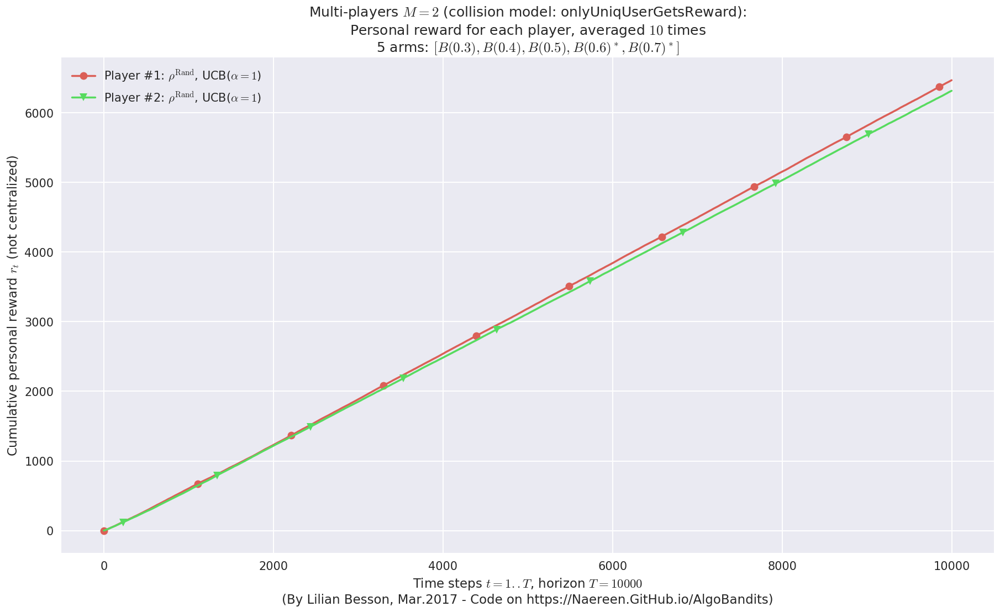

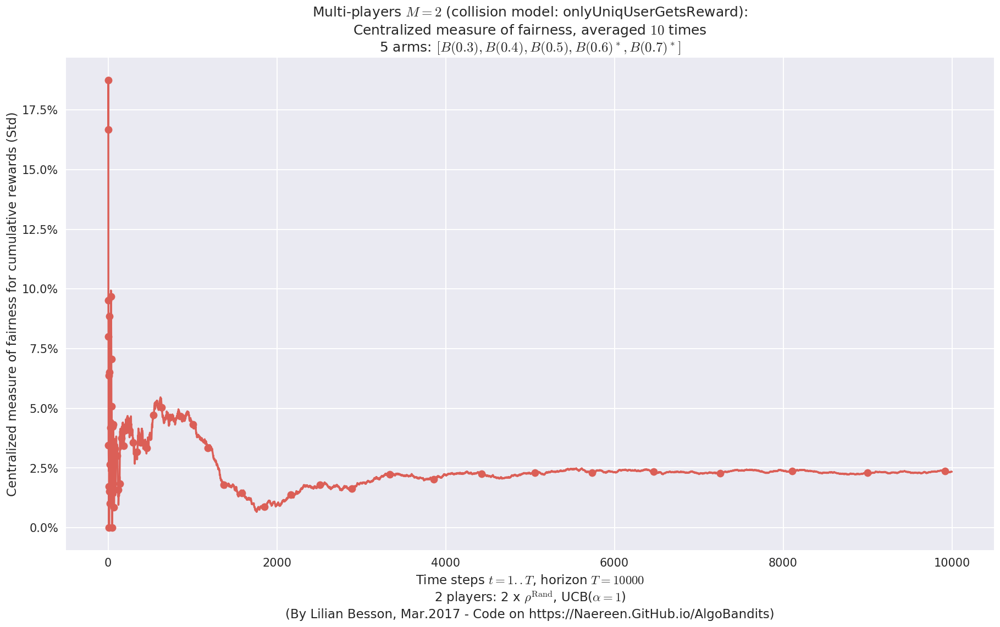

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


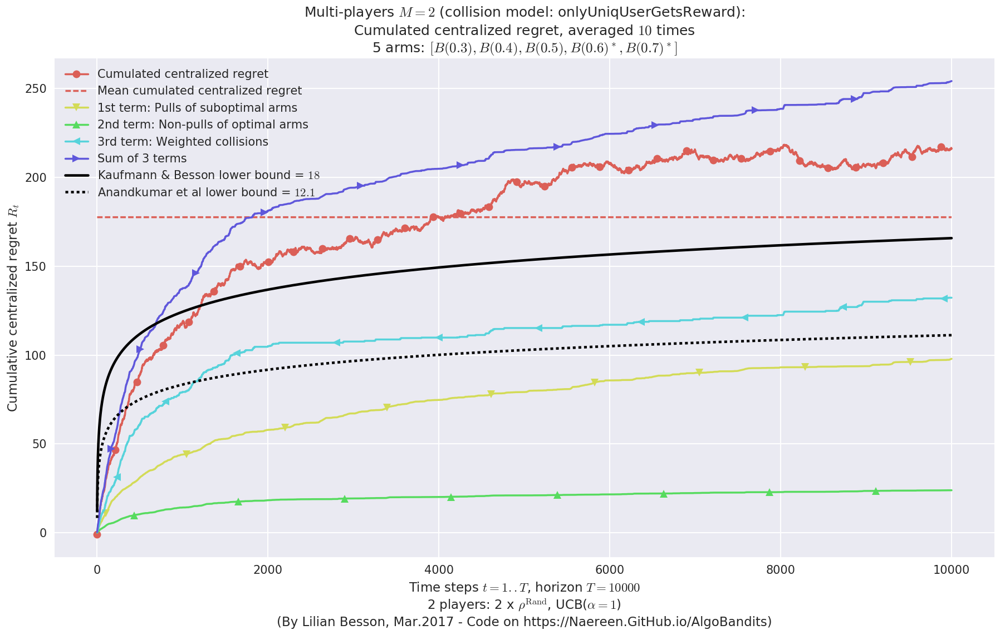

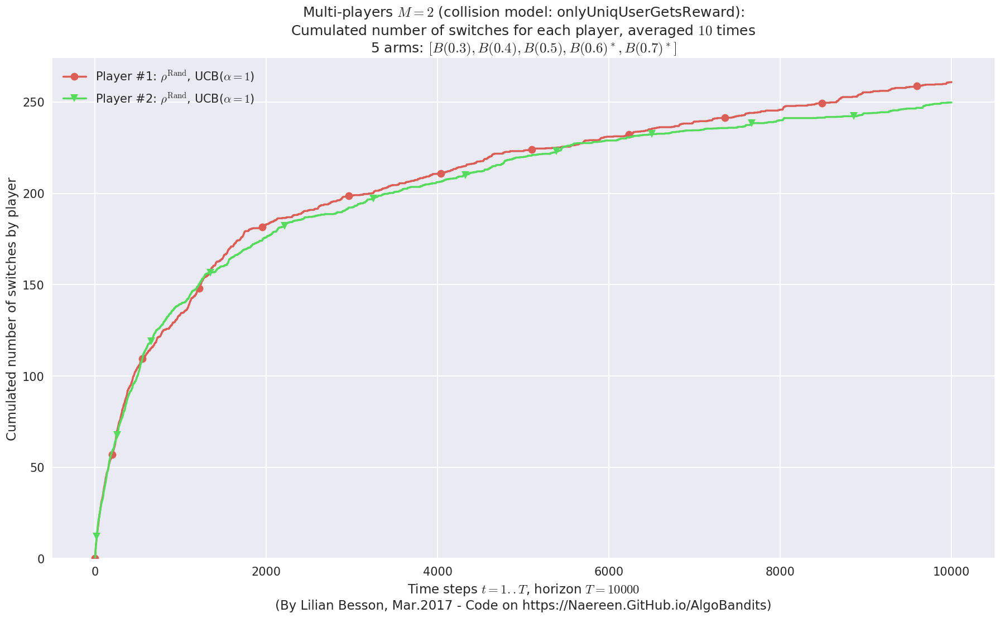

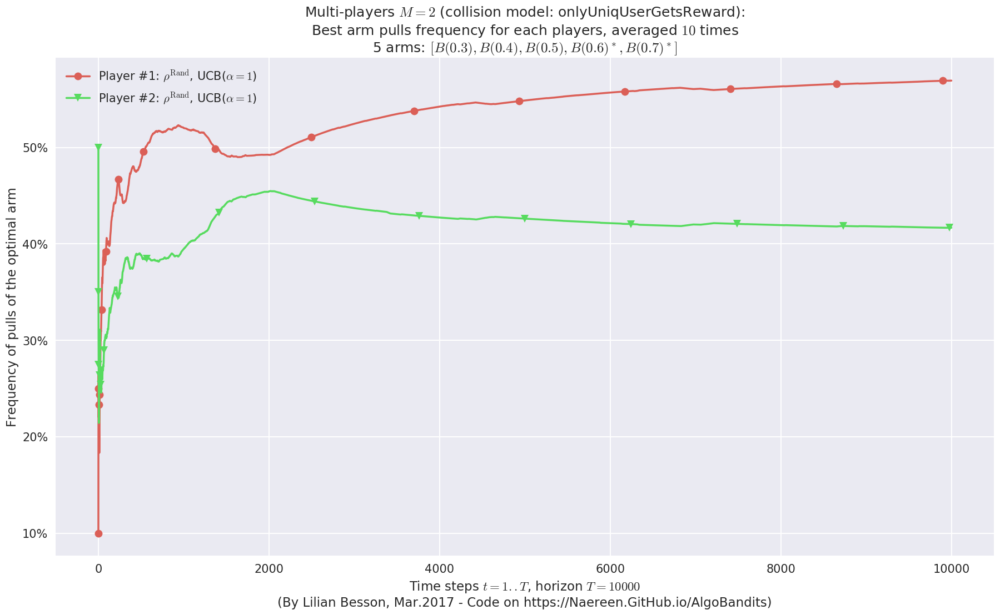

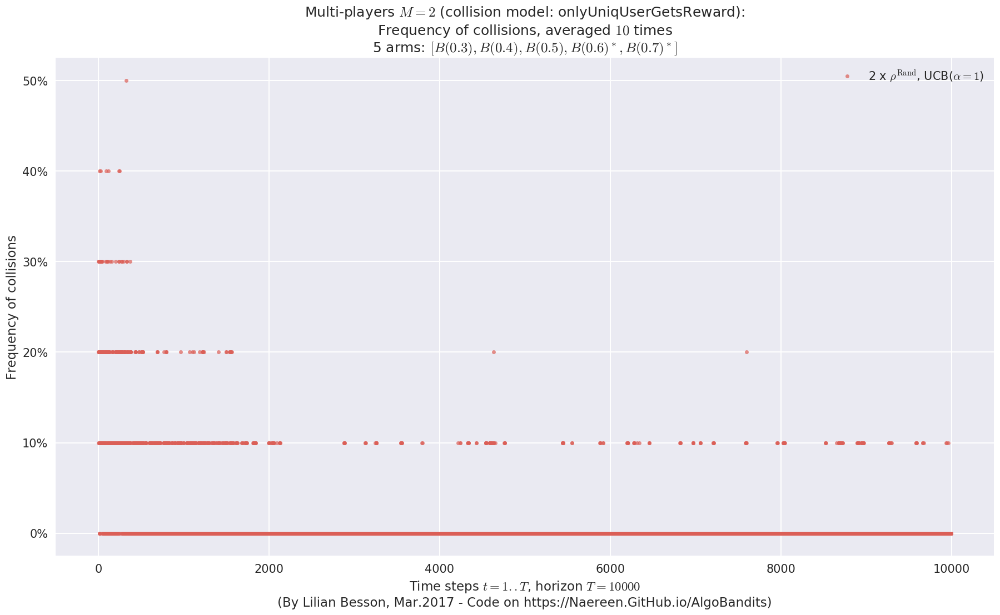

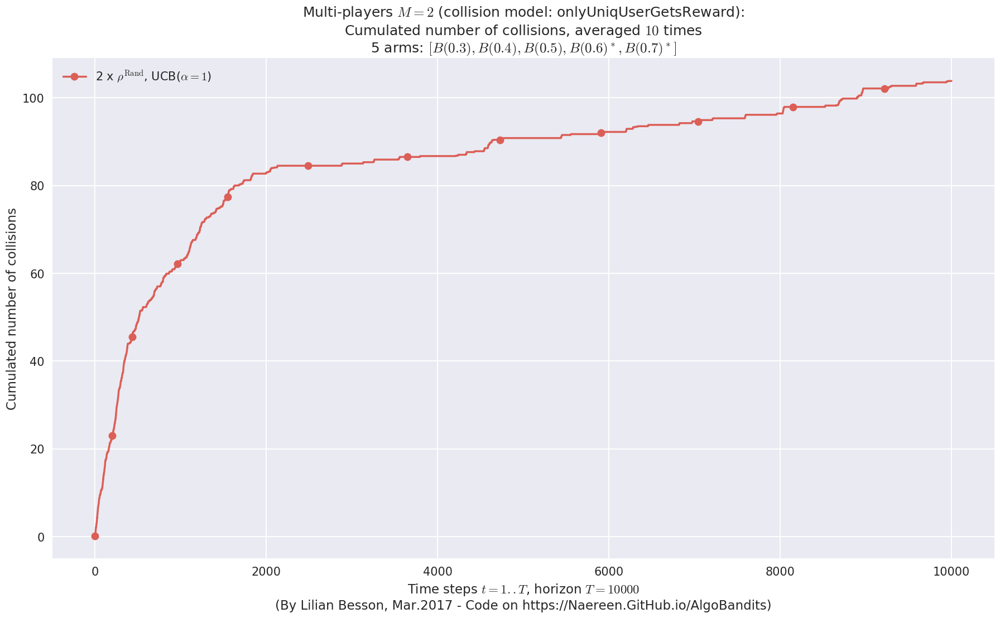

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 6e-05  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 0.00022  ...
  - For #$2$: $B(0.5)$ ($0.1%$$\%$),	frequency of collisions is 0.0005  ...
  - For #$3$: $B(0.6)$ ($0.5%$$\%$),	frequency of collisions is 0.00464  ...
  - For #$4$: $B(0.7)$ ($0.5%$$\%$),	frequency of collisions is 0.00496  ...


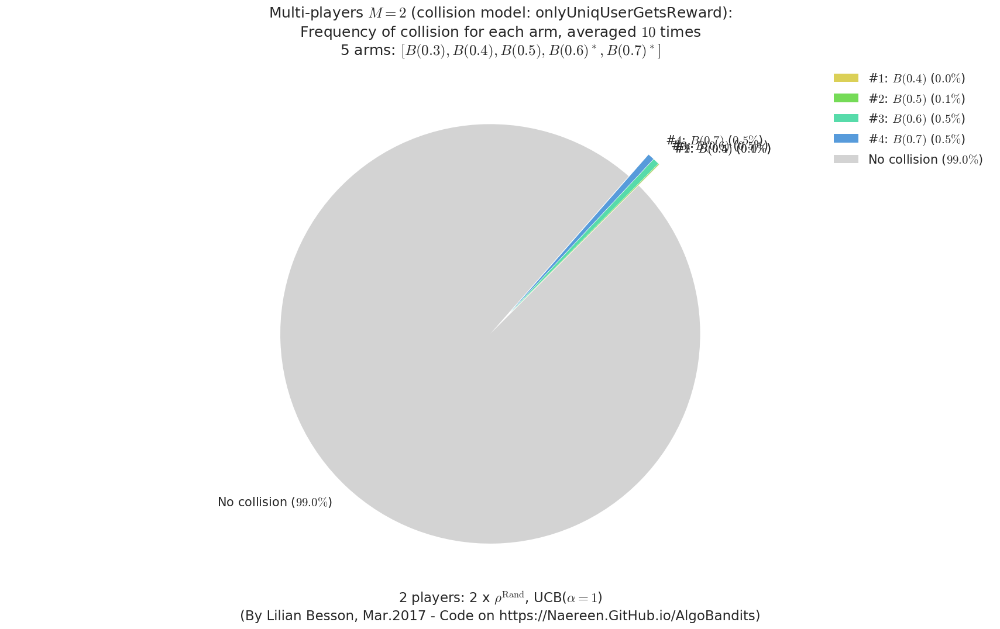


Final ranking for this environment #0 :
- Player #2, '#2<Selfish(UCB($\alpha=1$))>'	was ranked	1 / 2 for this simulation (last rewards = 6493.6).
- Player #1, '#1<Selfish(UCB($\alpha=1$))>'	was ranked	2 / 2 for this simulation (last rewards = 6308.5).


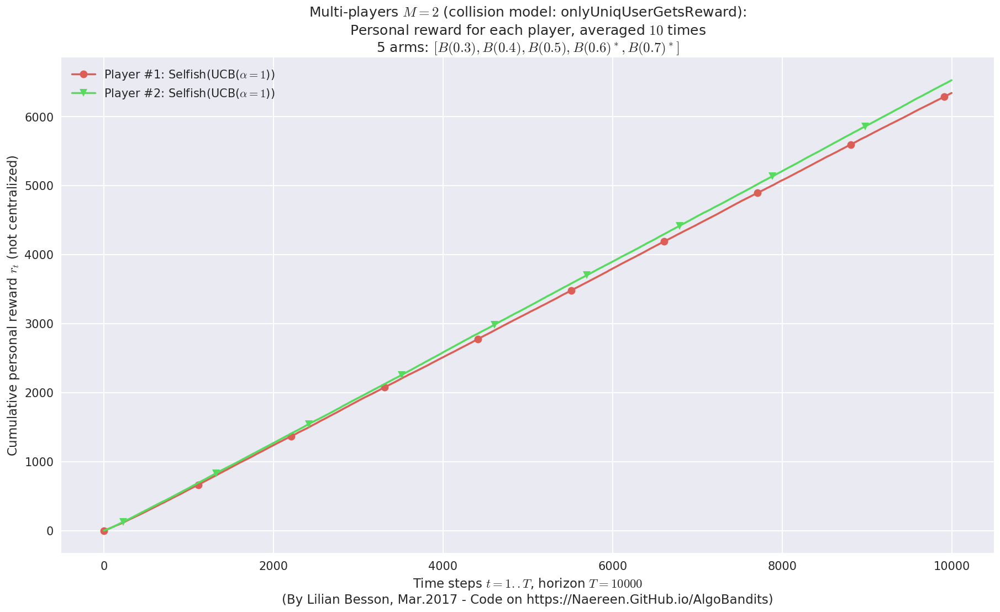

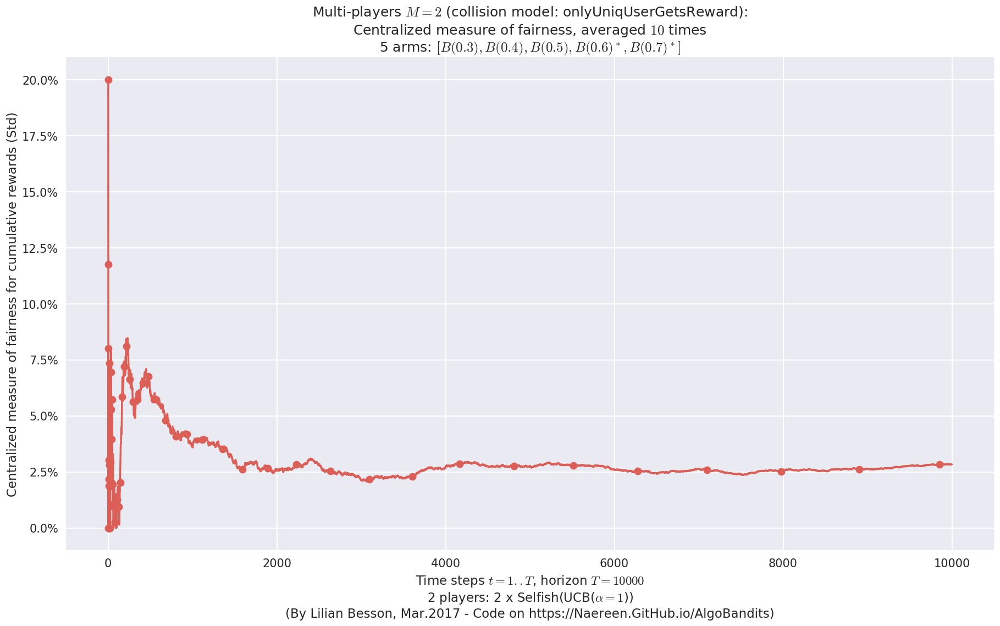

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


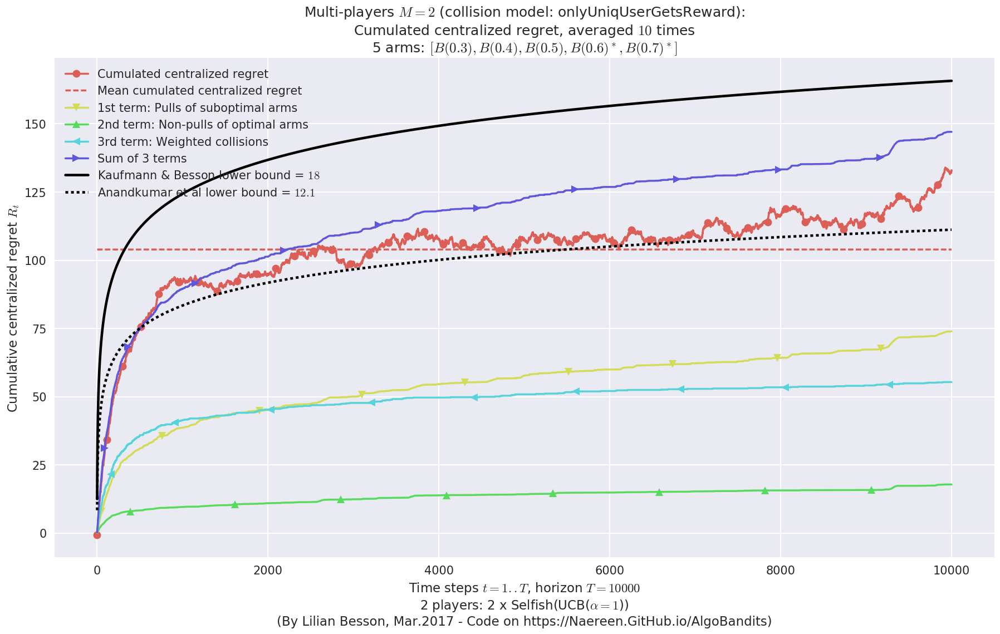

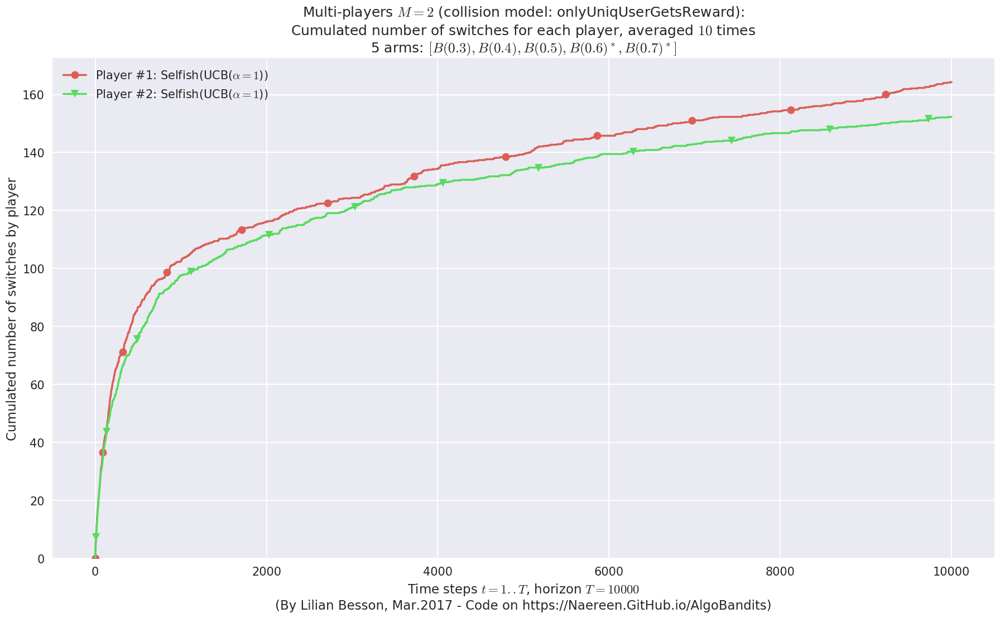

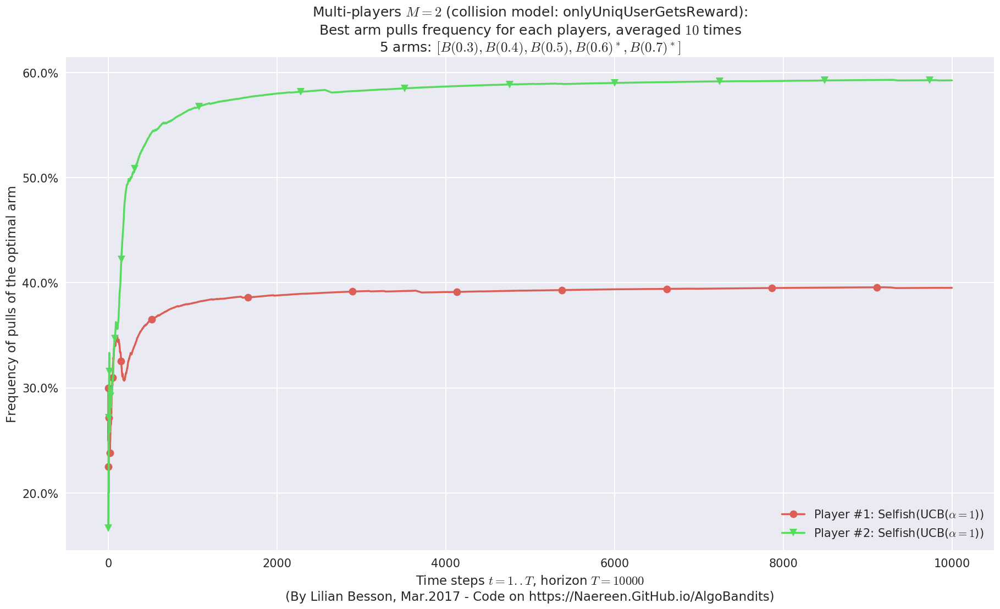

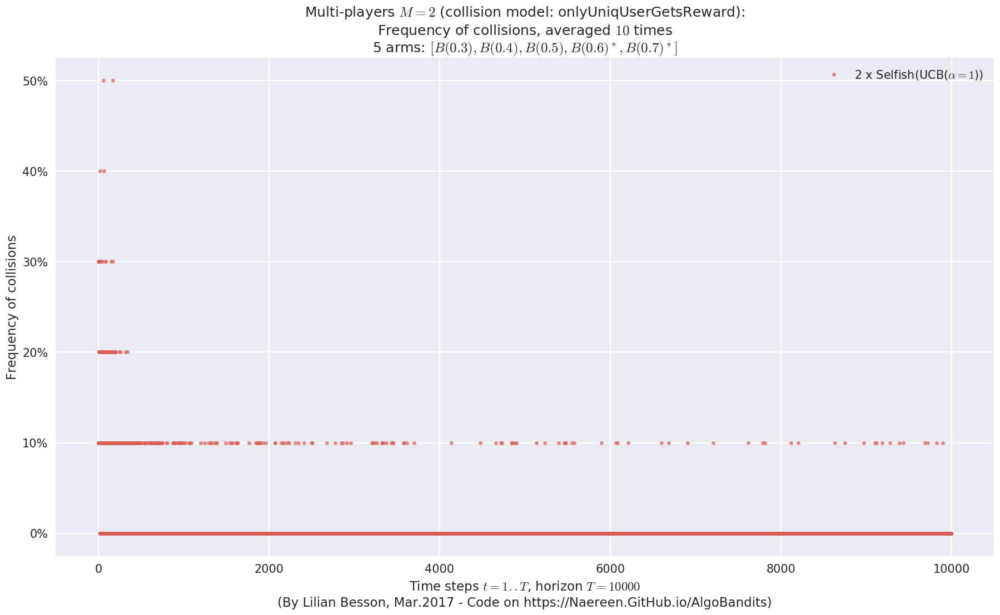

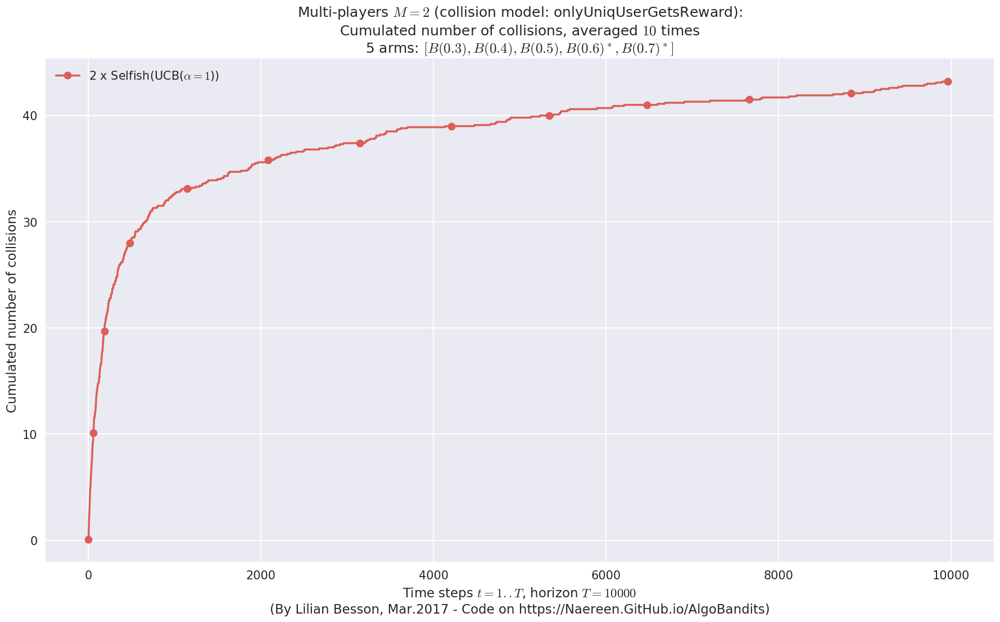

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 9e-05  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 0.00019  ...
  - For #$2$: $B(0.5)$ ($0.0%$$\%$),	frequency of collisions is 0.00036  ...
  - For #$3$: $B(0.6)$ ($0.1%$$\%$),	frequency of collisions is 0.00092  ...
  - For #$4$: $B(0.7)$ ($0.3%$$\%$),	frequency of collisions is 0.00276  ...


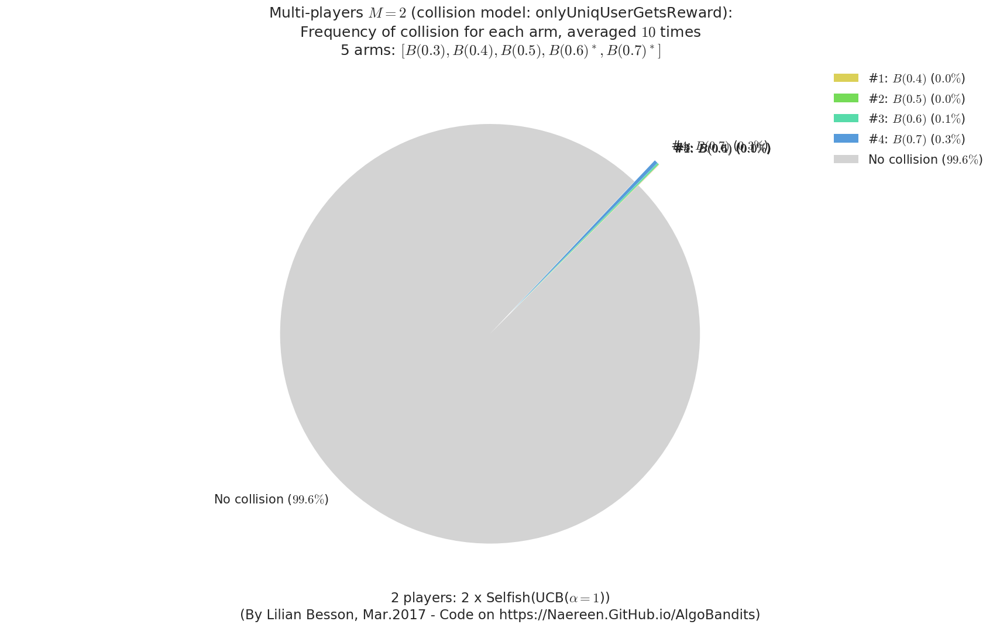


Final ranking for this environment #0 :
- Player #1, '#1<$\rho^{\mathrm{Rand}}$, Thompson>'	was ranked	1 / 2 for this simulation (last rewards = 6580.6).
- Player #2, '#2<$\rho^{\mathrm{Rand}}$, Thompson>'	was ranked	2 / 2 for this simulation (last rewards = 6062.6).


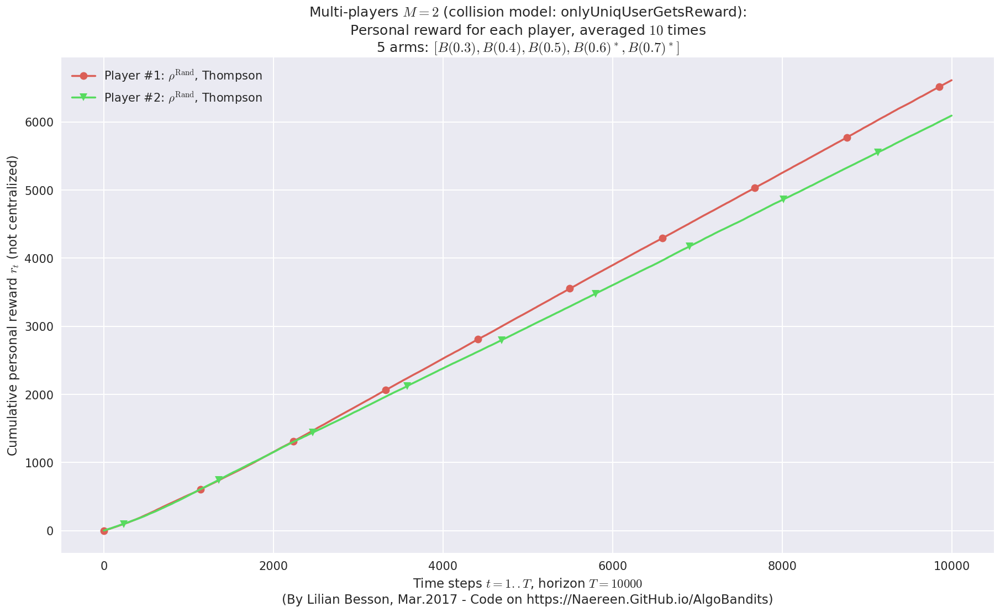

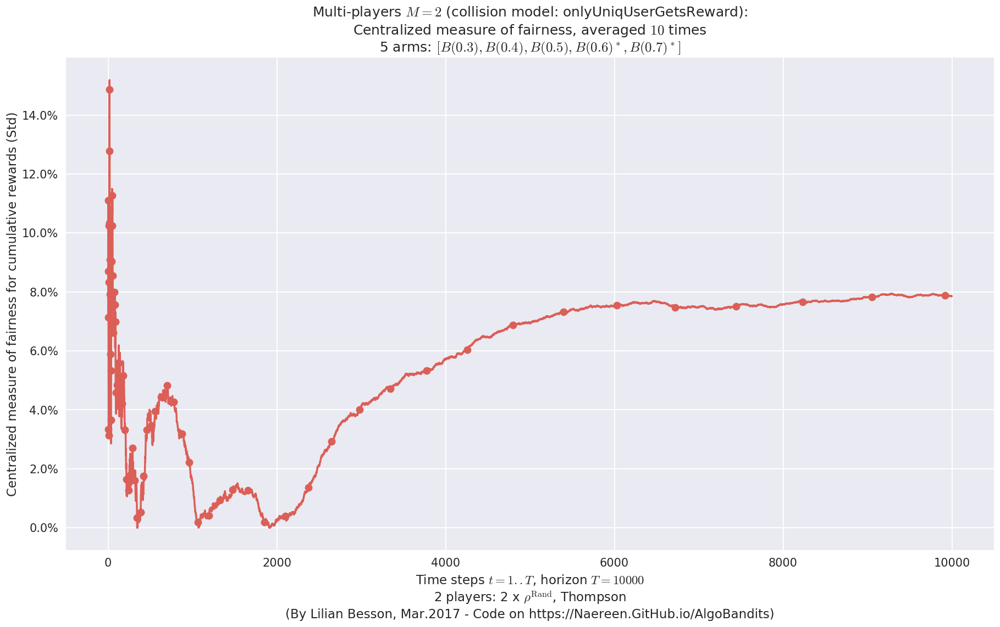

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


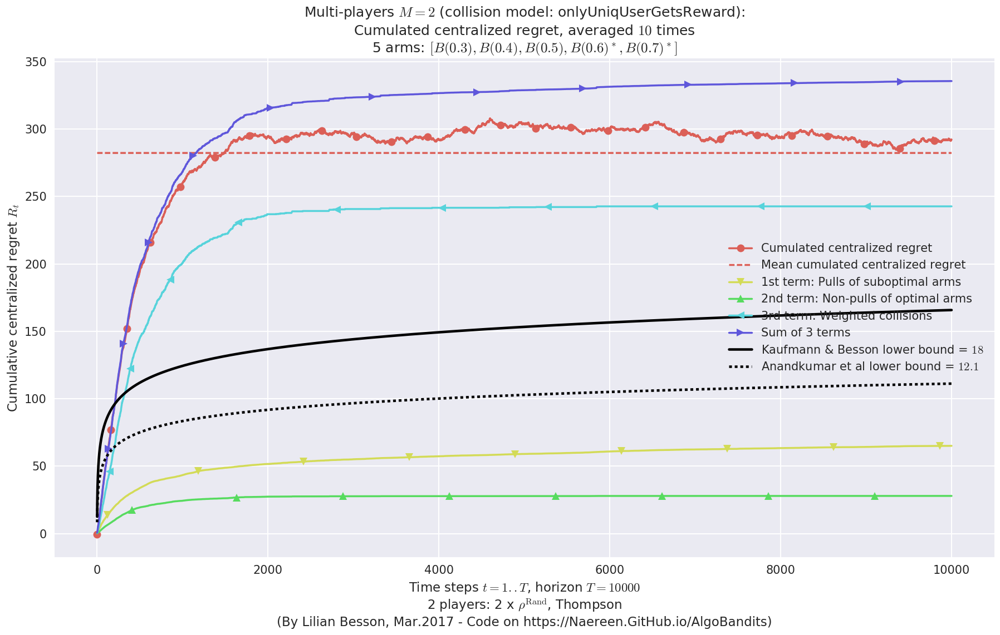

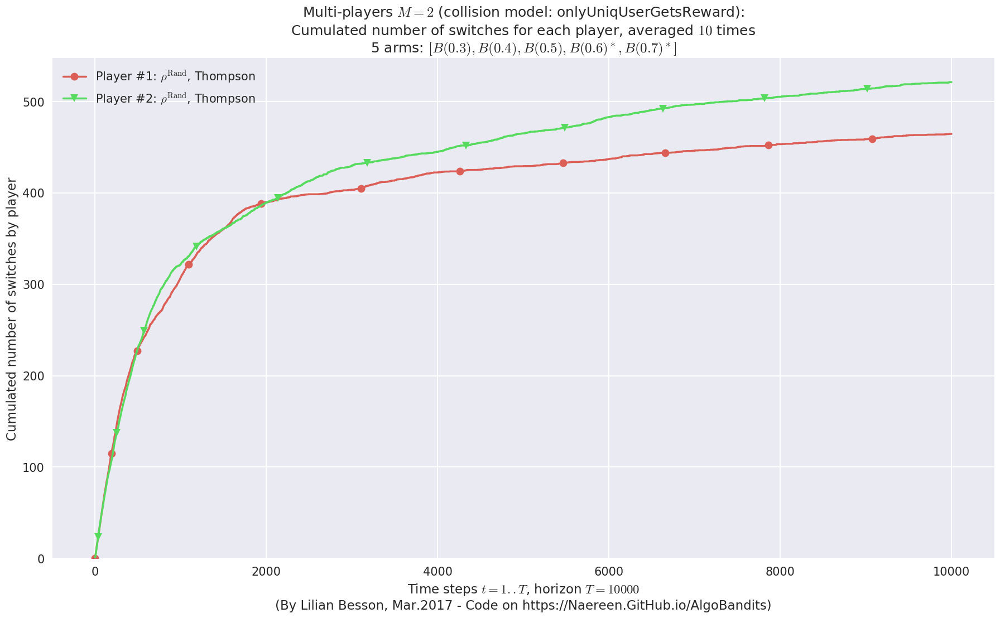

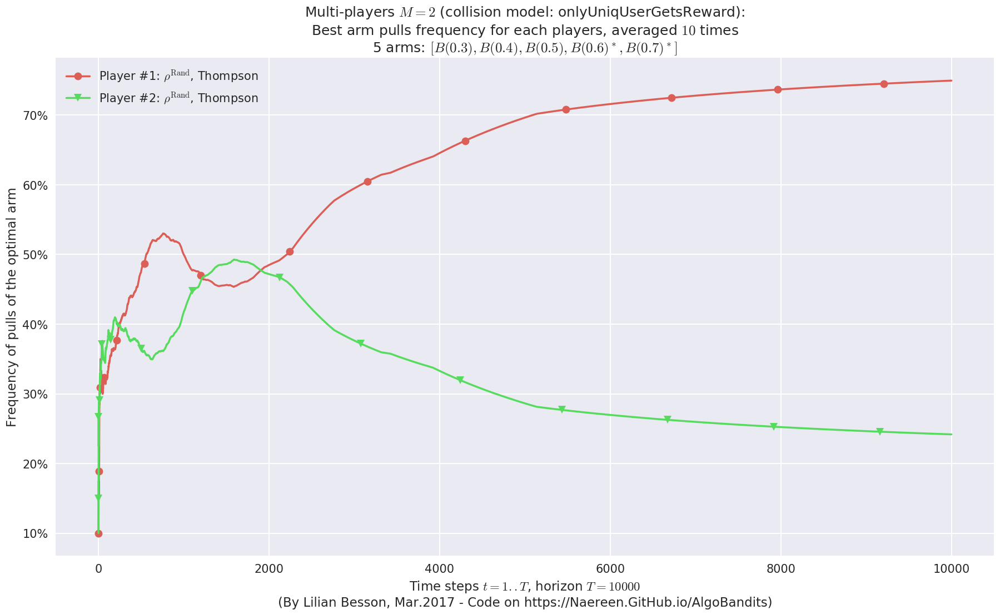

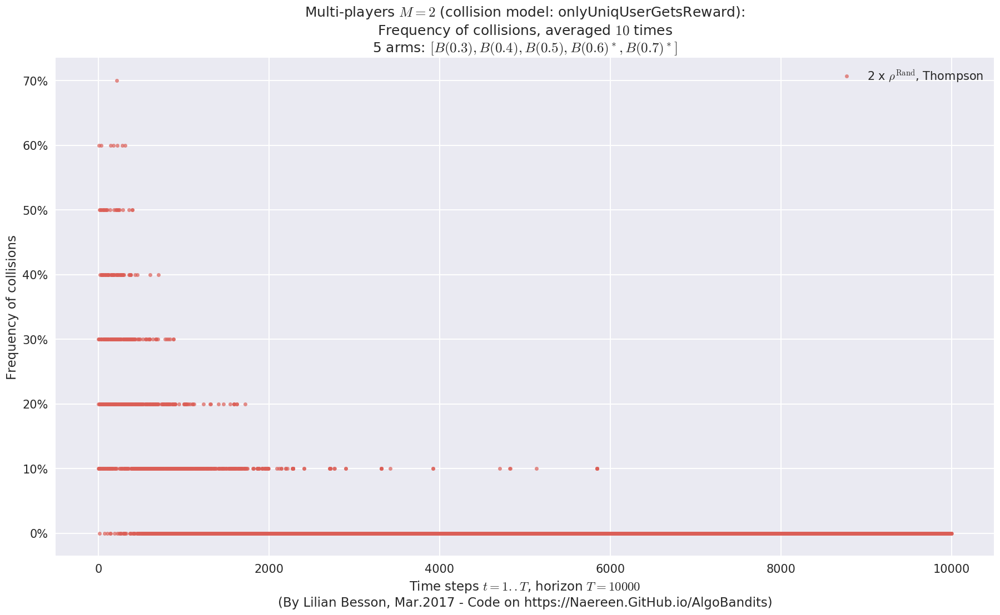

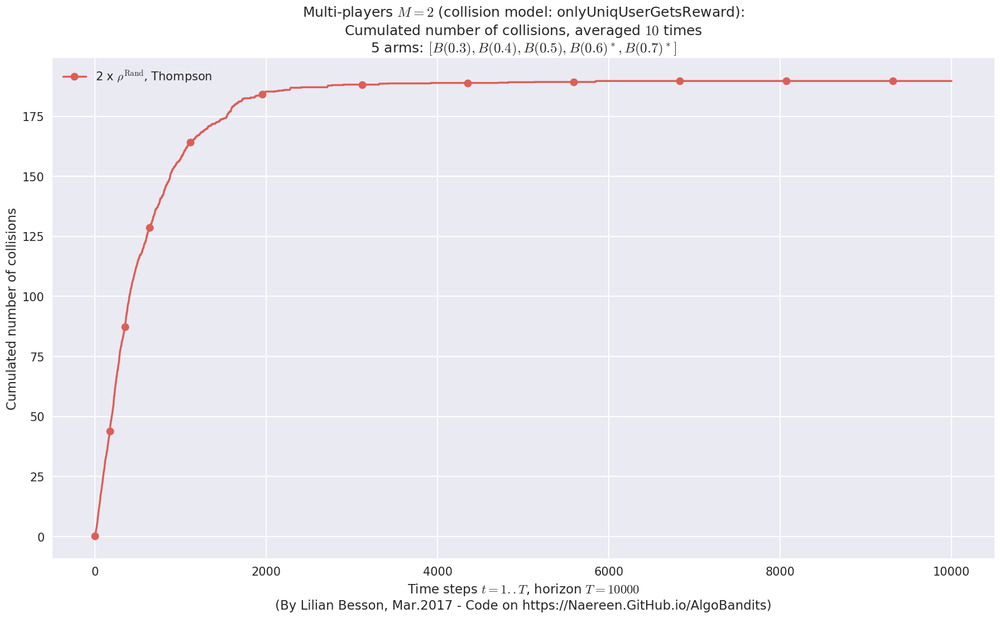

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 0.00011  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 0.00036  ...
  - For #$2$: $B(0.5)$ ($0.1%$$\%$),	frequency of collisions is 0.00106  ...
  - For #$3$: $B(0.6)$ ($0.8%$$\%$),	frequency of collisions is 0.00782  ...
  - For #$4$: $B(0.7)$ ($1.0%$$\%$),	frequency of collisions is 0.00962  ...


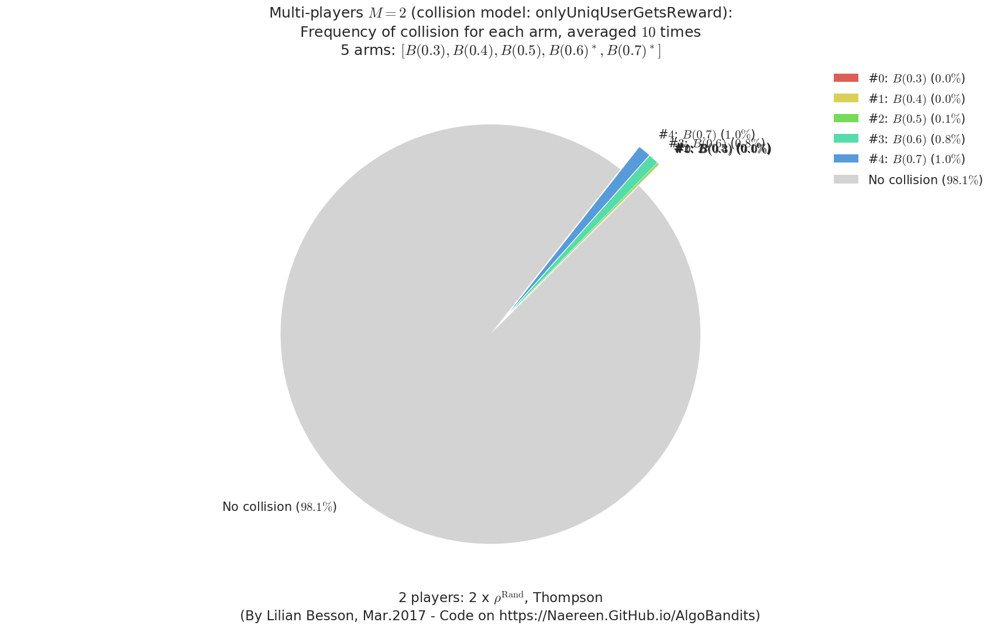


Final ranking for this environment #0 :
- Player #2, '#2<Selfish(Thompson)>'	was ranked	1 / 2 for this simulation (last rewards = 6429.3).
- Player #1, '#1<Selfish(Thompson)>'	was ranked	2 / 2 for this simulation (last rewards = 6413.7).


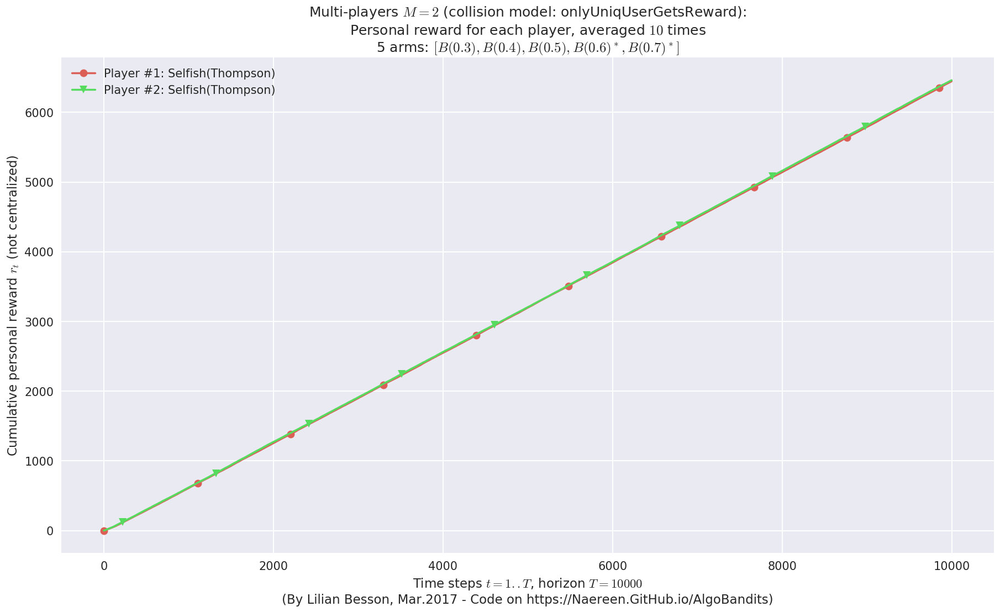

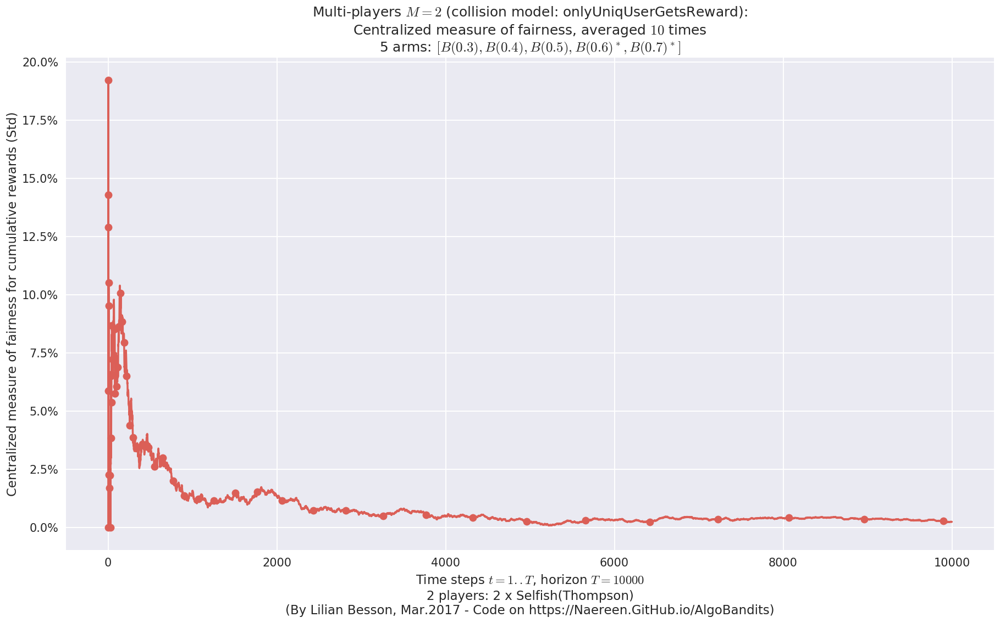

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


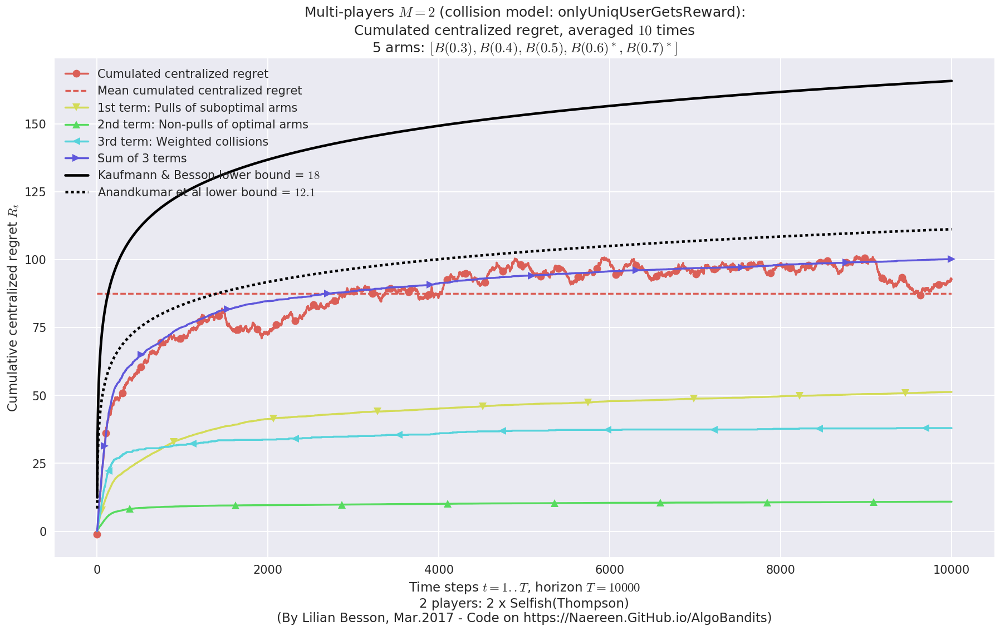

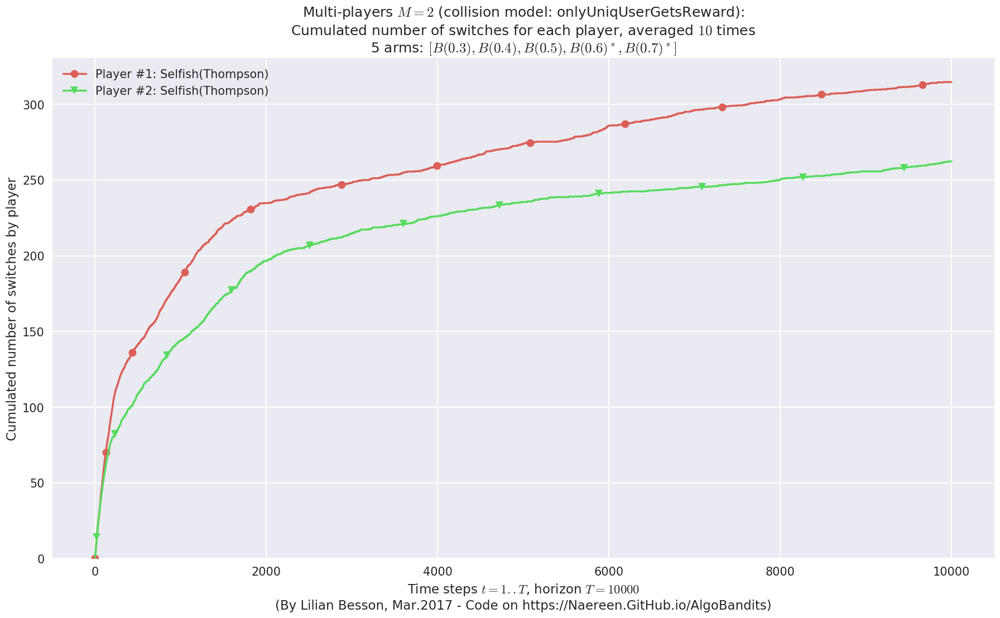

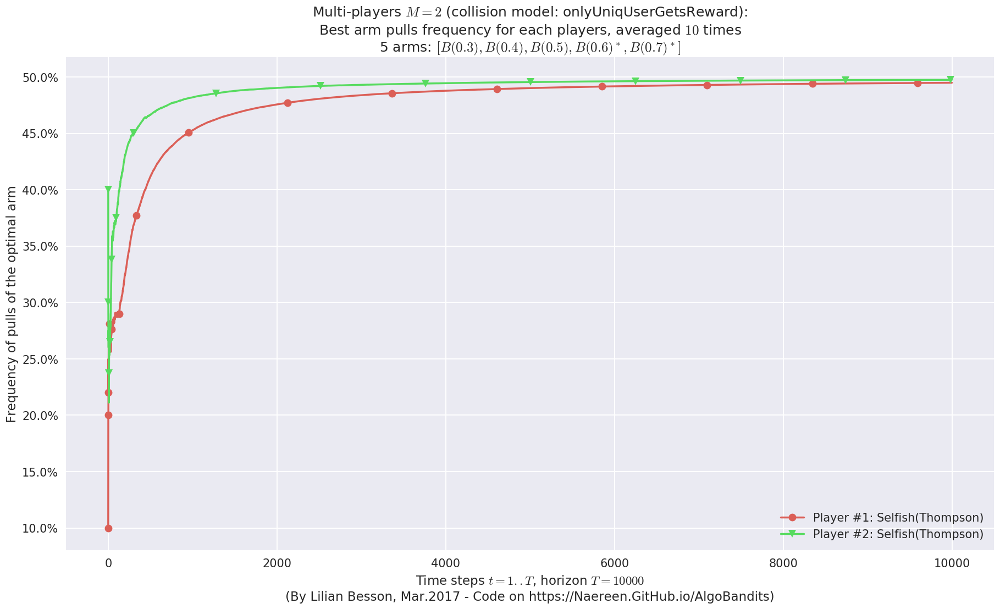

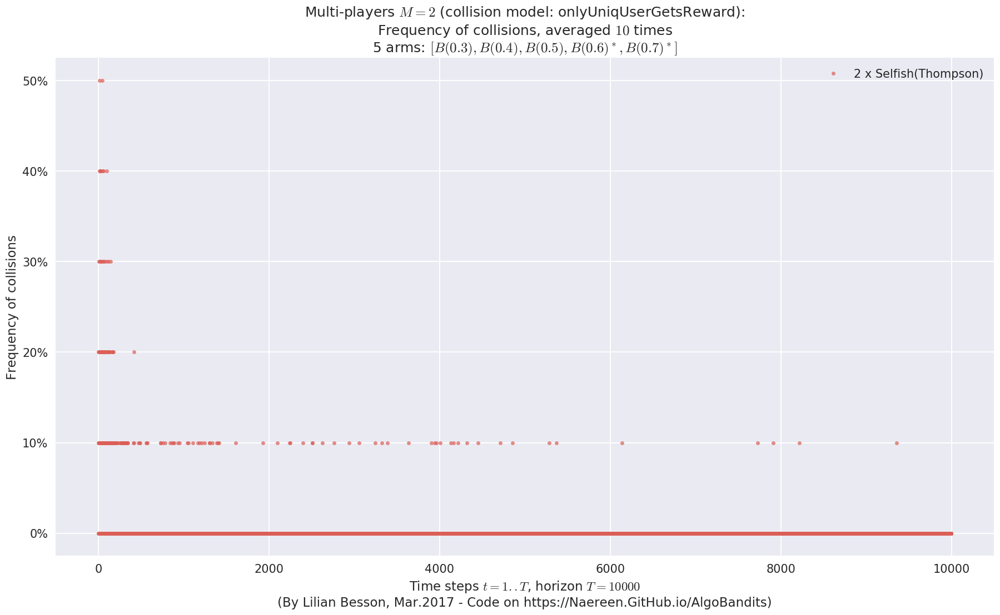

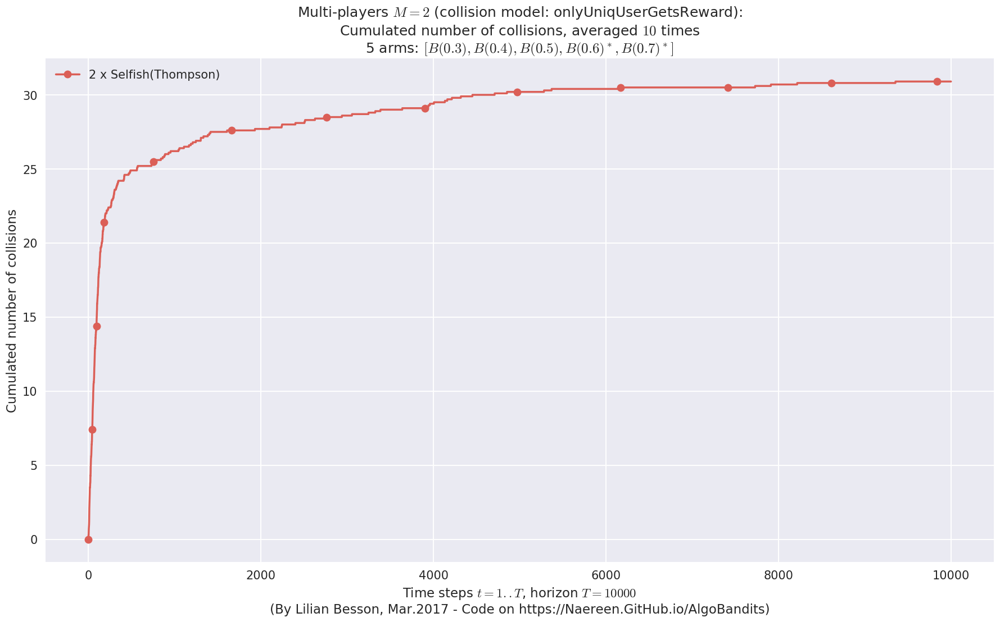

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 0.00013  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 0.00016  ...
  - For #$2$: $B(0.5)$ ($0.0%$$\%$),	frequency of collisions is 0.00043  ...
  - For #$3$: $B(0.6)$ ($0.1%$$\%$),	frequency of collisions is 0.00078  ...
  - For #$4$: $B(0.7)$ ($0.2%$$\%$),	frequency of collisions is 0.00159  ...


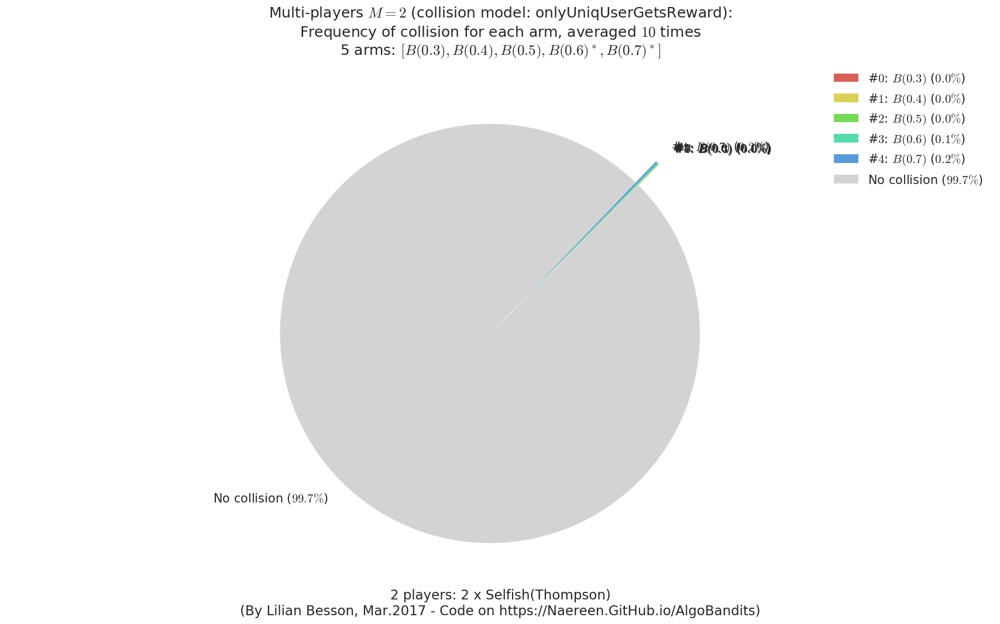


Final ranking for this environment #0 :
- Player #2, '#2<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)>'	was ranked	1 / 2 for this simulation (last rewards = 6359.3).
- Player #1, '#1<$\rho^{\mathrm{Rand}}$, KL-UCB(Bern)>'	was ranked	2 / 2 for this simulation (last rewards = 6348.9).


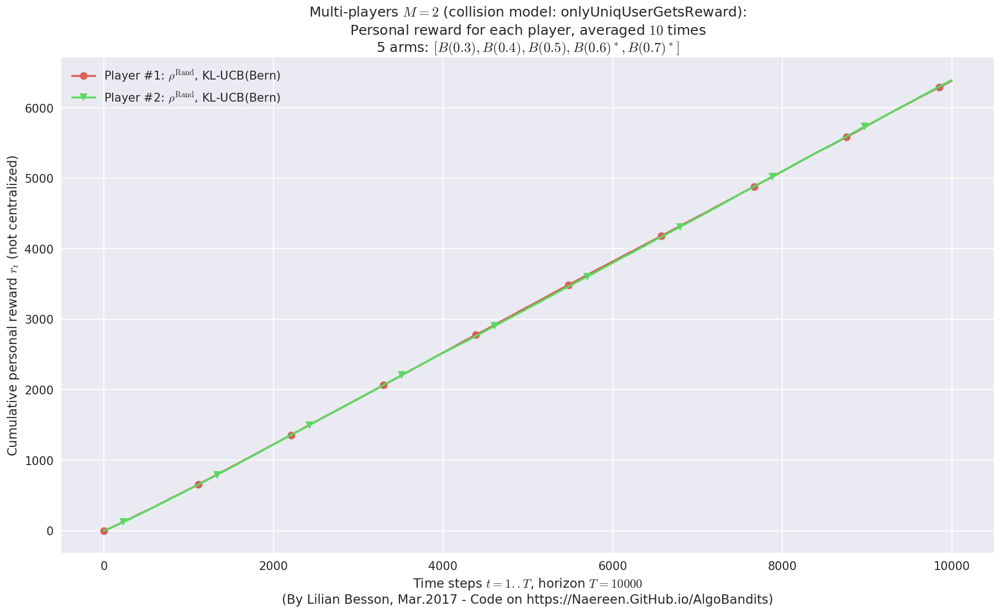

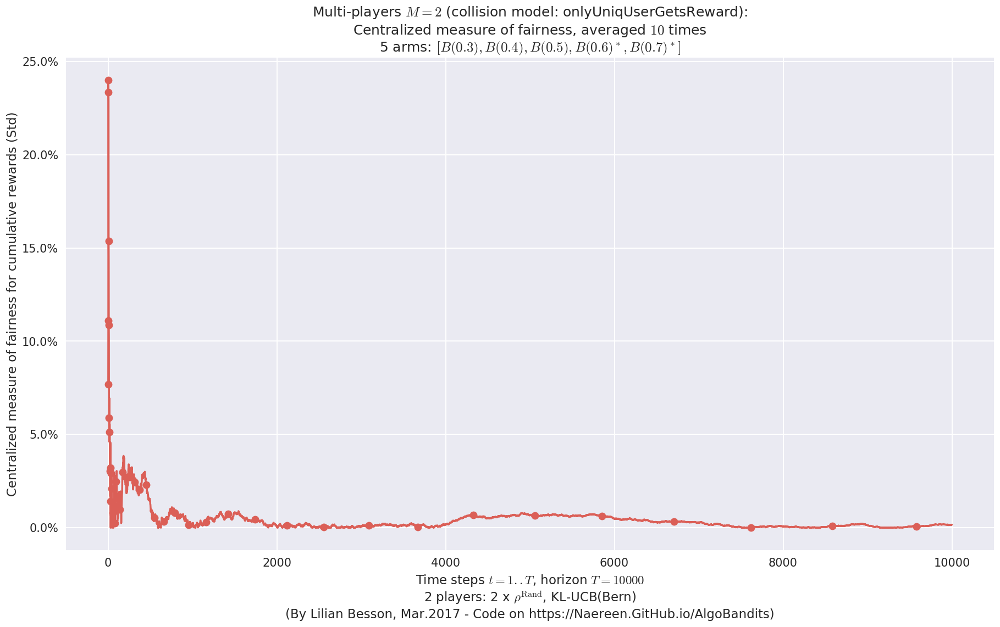

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


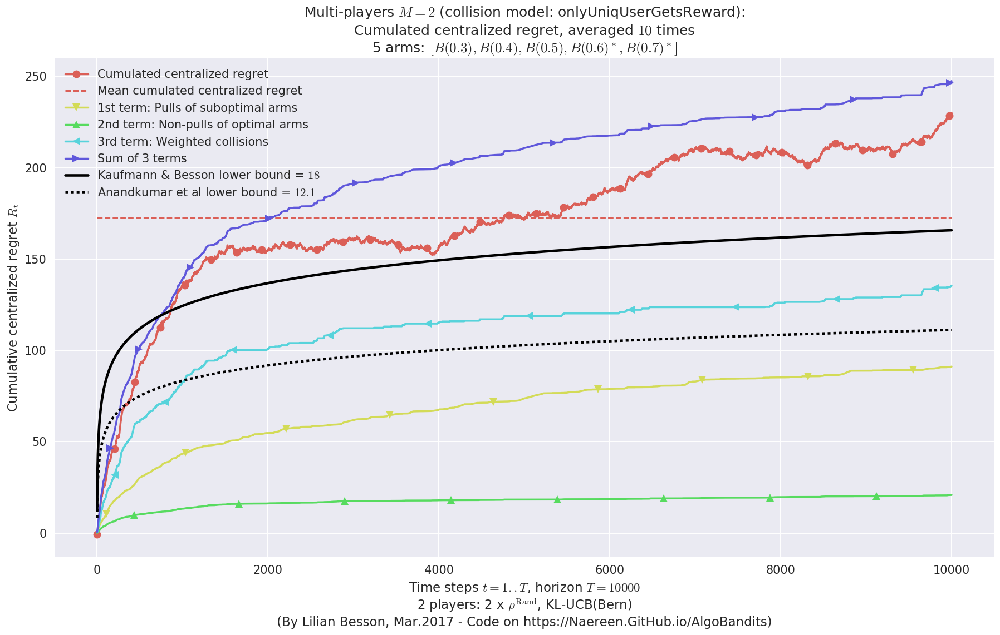

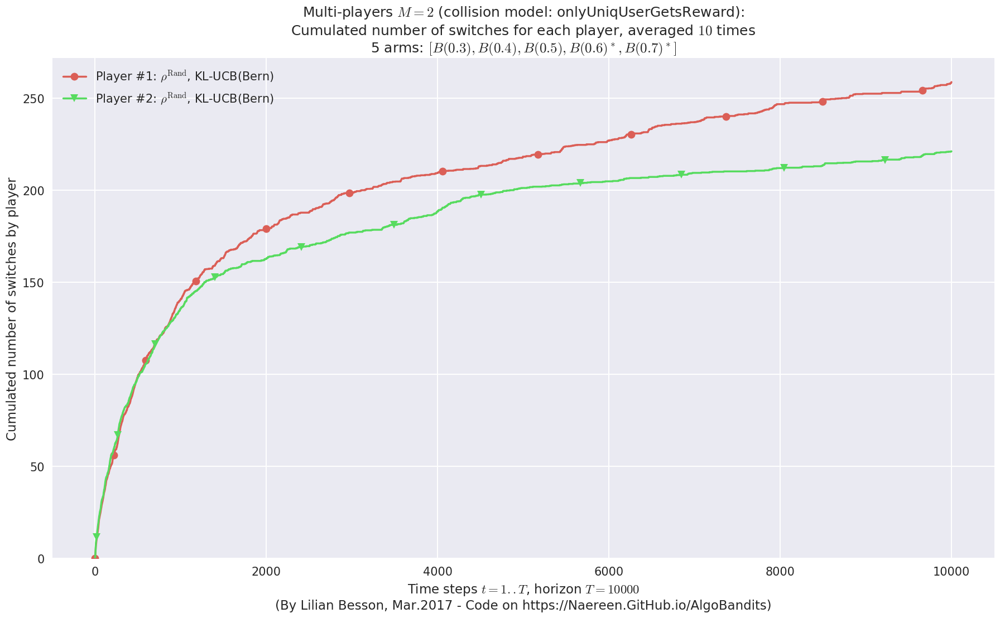

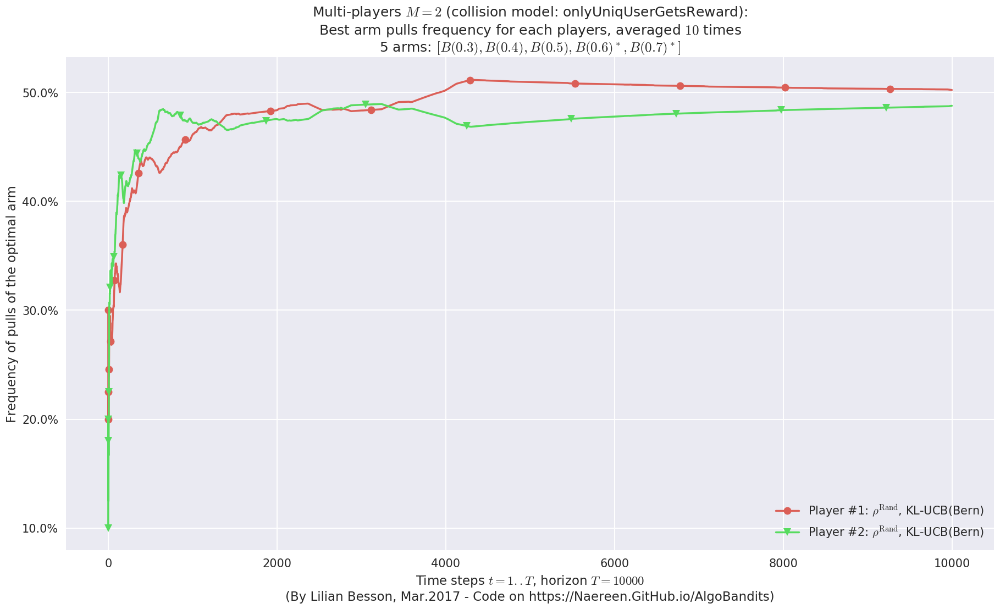

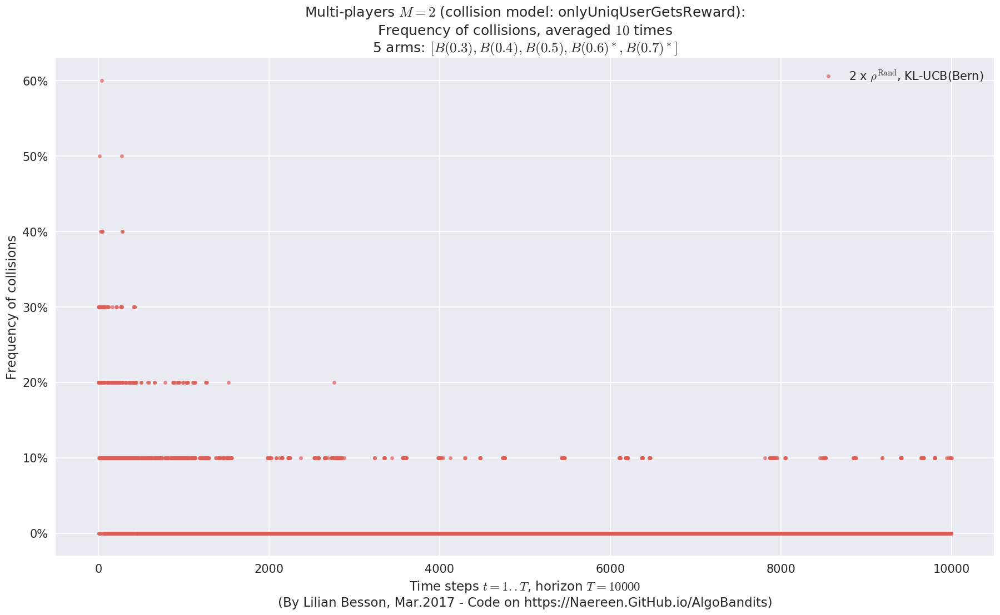

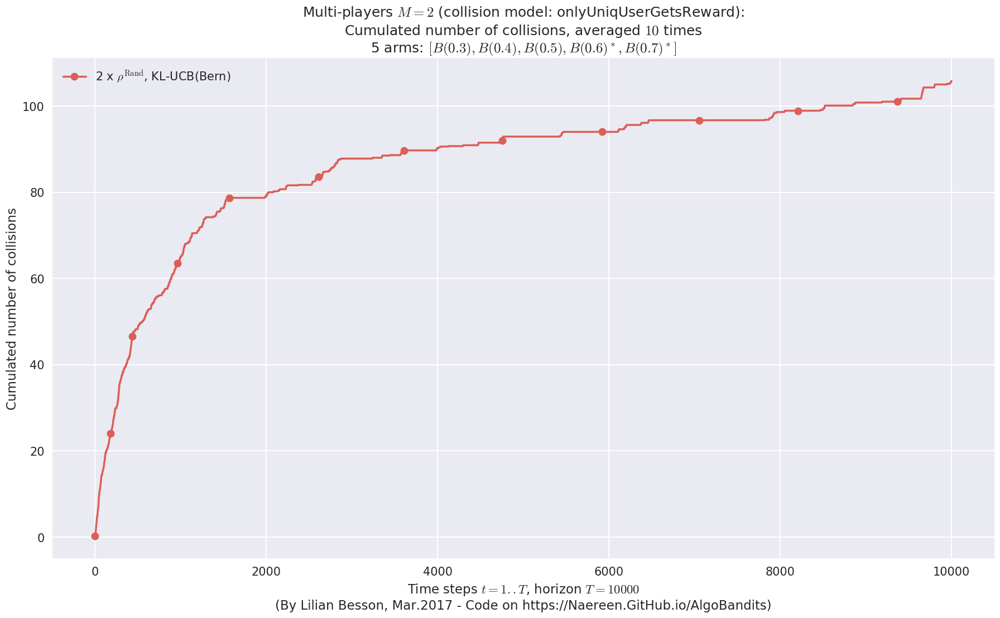

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 0.00013  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 0.00012  ...
  - For #$2$: $B(0.5)$ ($0.1%$$\%$),	frequency of collisions is 0.00057  ...
  - For #$3$: $B(0.6)$ ($0.4%$$\%$),	frequency of collisions is 0.00431  ...
  - For #$4$: $B(0.7)$ ($0.5%$$\%$),	frequency of collisions is 0.00545  ...


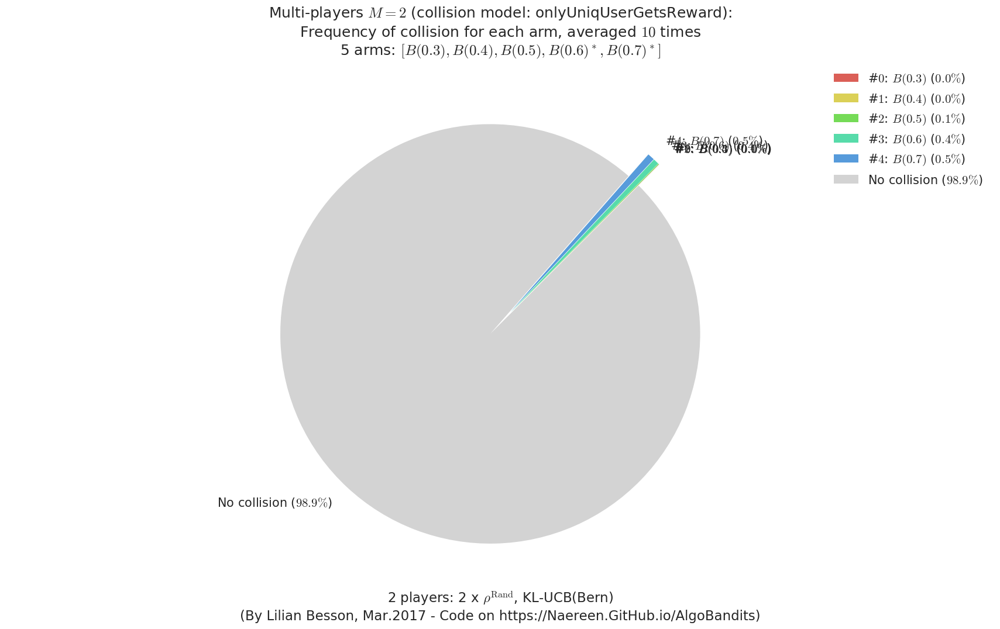


Final ranking for this environment #0 :
- Player #2, '#2<Selfish(KL-UCB(Bern))>'	was ranked	1 / 2 for this simulation (last rewards = 6434.7).
- Player #1, '#1<Selfish(KL-UCB(Bern))>'	was ranked	2 / 2 for this simulation (last rewards = 6414.7).


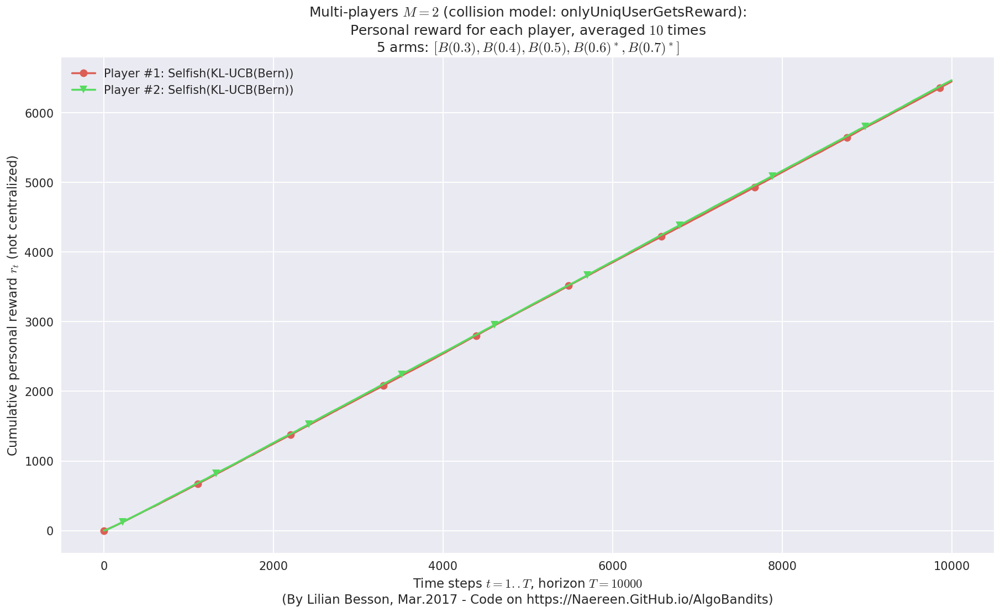

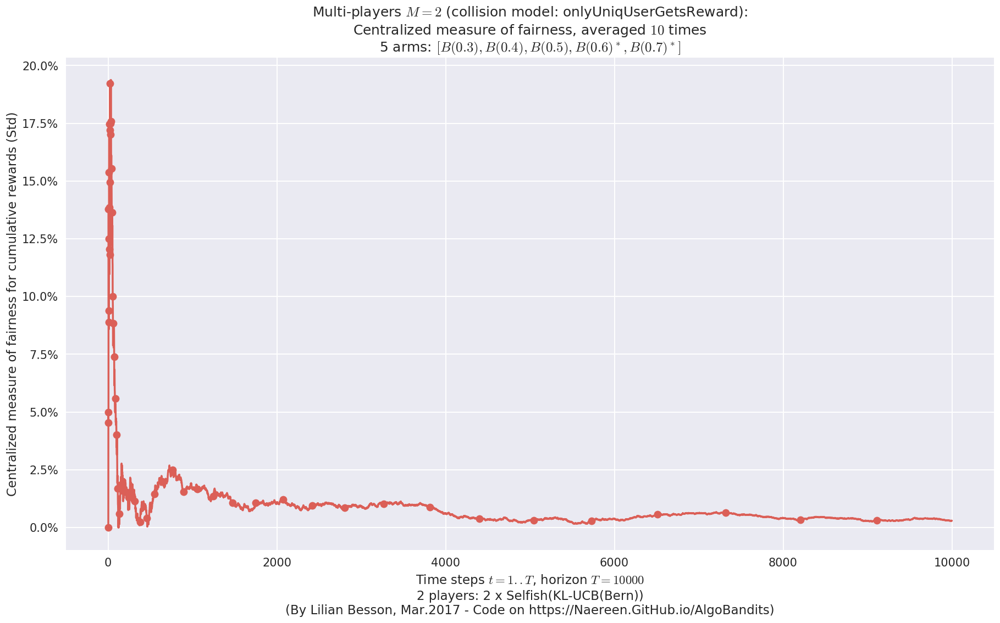

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


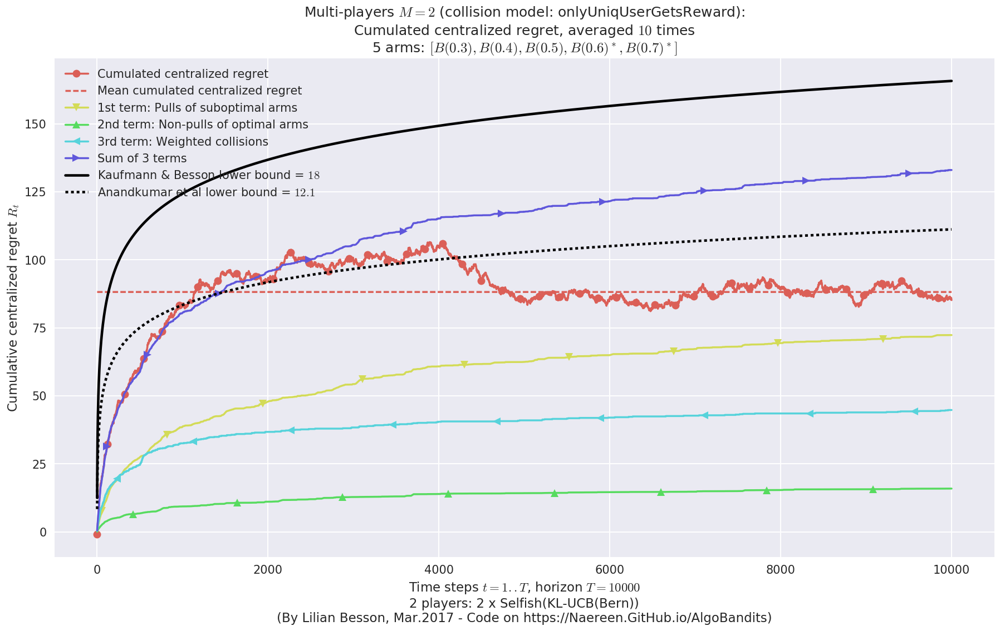

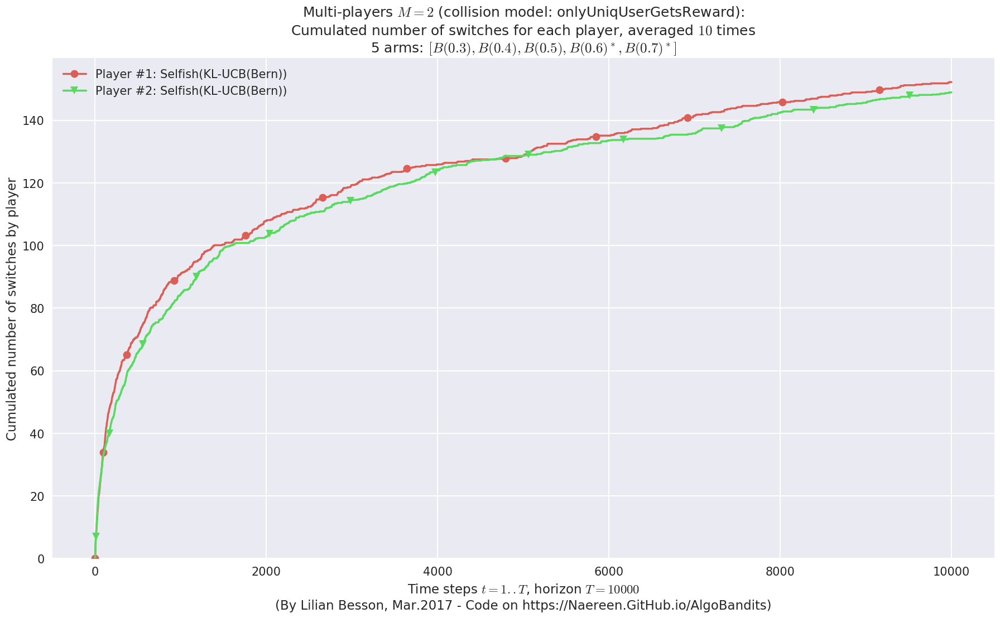

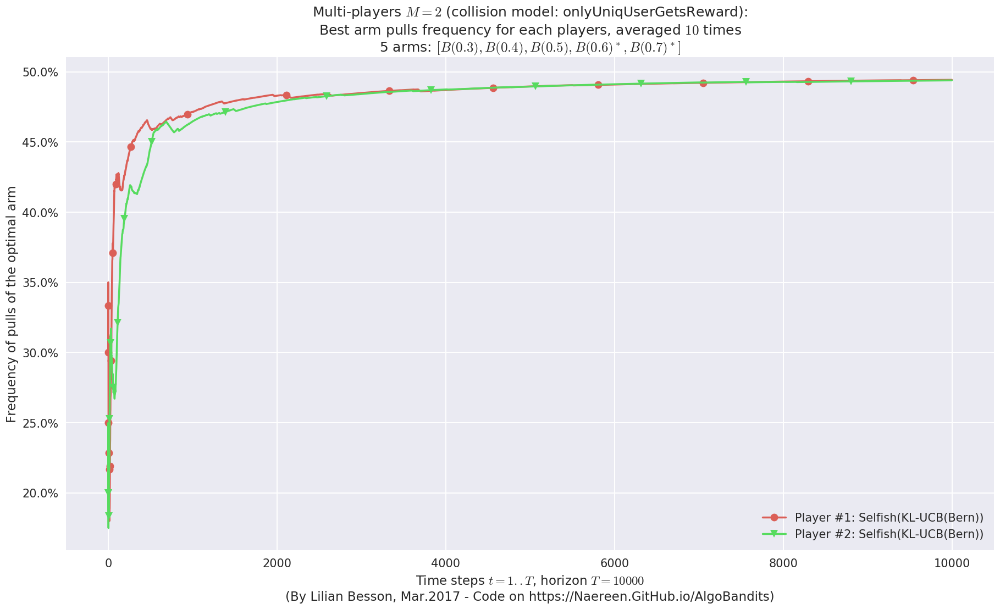

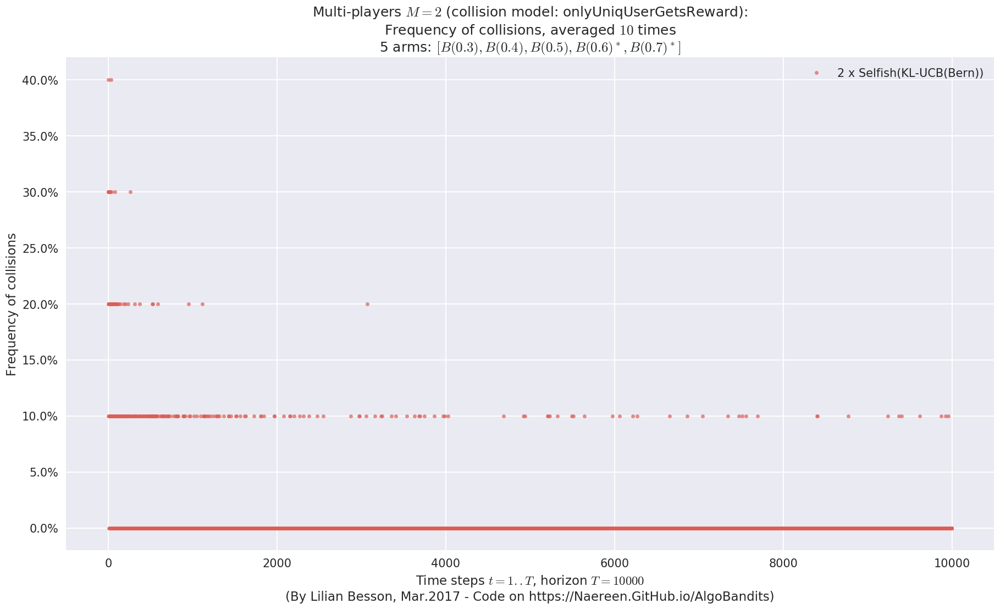

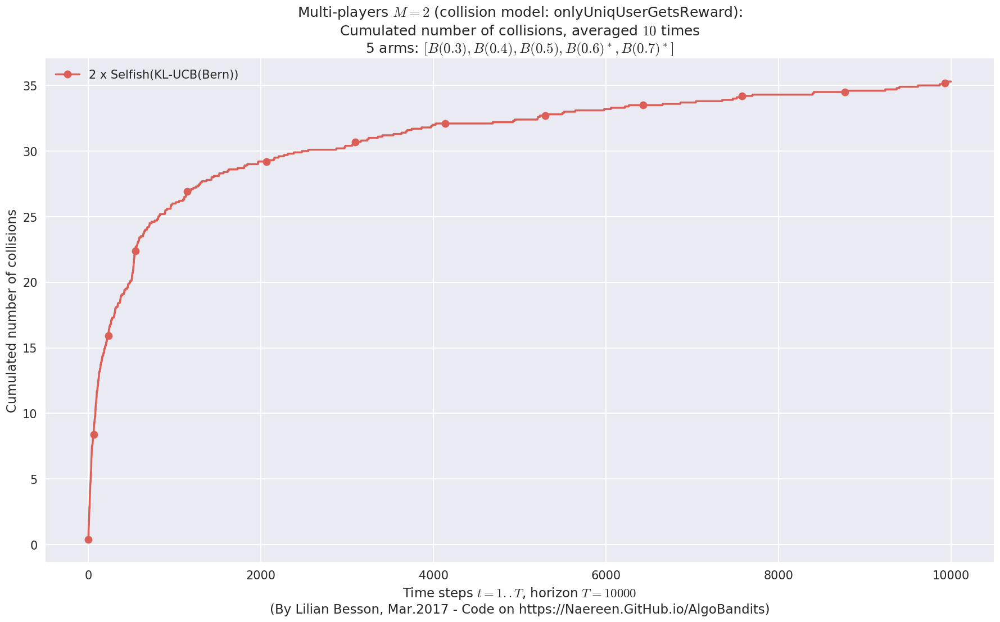

  - For #$0$: $B(0.3)$ ($0.0%$$\%$),	frequency of collisions is 0.00012  ...
  - For #$1$: $B(0.4)$ ($0.0%$$\%$),	frequency of collisions is 8e-05  ...
  - For #$2$: $B(0.5)$ ($0.0%$$\%$),	frequency of collisions is 0.0003  ...
  - For #$3$: $B(0.6)$ ($0.1%$$\%$),	frequency of collisions is 0.001  ...
  - For #$4$: $B(0.7)$ ($0.2%$$\%$),	frequency of collisions is 0.00203  ...


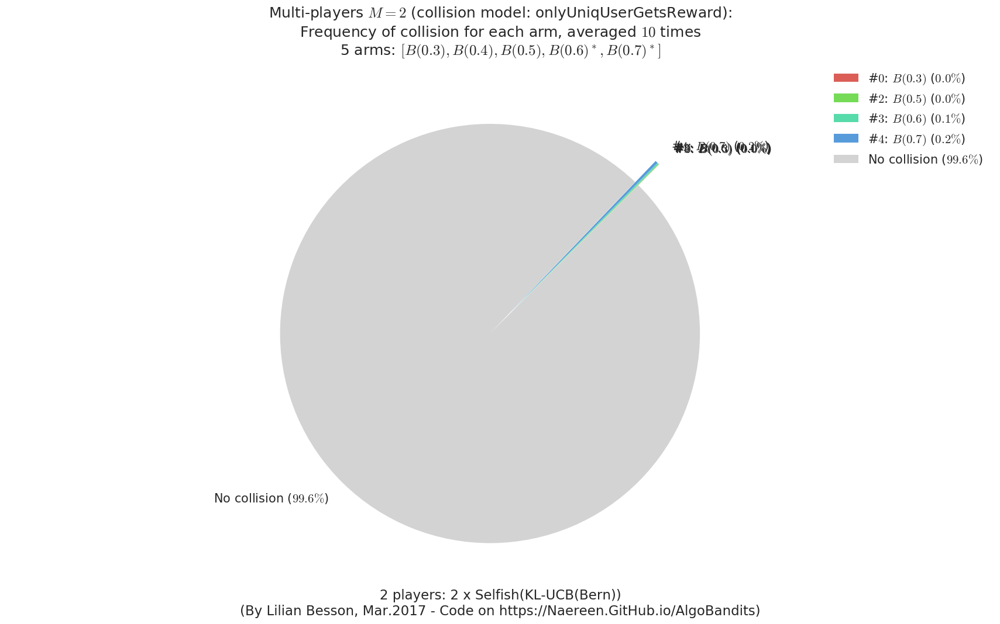

In [19]:
for playersId in tqdm(range(len(evs)), desc="Policies"):
    evaluation = evaluators[0][playersId]
    plotAll(evaluation, 0)

### Second problem
$\mu = [0.1, 0.3, 0.5, 0.7, 0.9]$ was an easier Bernoulli problem, with larger gap $\Delta = 0.2$.

In [ ]:
for playersId in tqdm(range(len(evs)), desc="Policies"):
    evaluation = evaluators[1][playersId]
    plotAll(evaluation, 1)

### Third problem
$\mu = [0.005, 0.01, 0.015, 0.84, 0.85]$ is an harder Bernoulli problem, as there is a huge gap between suboptimal and optimal arms.

In [ ]:
for playersId in tqdm(range(len(evs)), desc="Policies"):
    evaluation = evaluators[2][playersId]
    plotAll(evaluation, 2)

---
### Comparing their performances

In [20]:
def plotCombined(e0, eothers, envId):
    # Centralized regret
    e0.plotRegretCentralized(envId, evaluators=eothers)
    # Fairness
    e0.plotFairness(envId, fairness="STD", evaluators=eothers)
    # Number of switches
    e0.plotNbSwitchsCentralized(envId, cumulated=True, evaluators=eothers)
    # Number of collisions - not for Centralized* policies
    e0.plotNbCollisions(envId, cumulated=True, evaluators=eothers)

  - For 2 player, our lower bound gave = 18 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 12.1 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 9.46 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 60.00% ...
 - Our lowerbound = 18,
 - [Anandkumar et al] lowerbound = 12.1


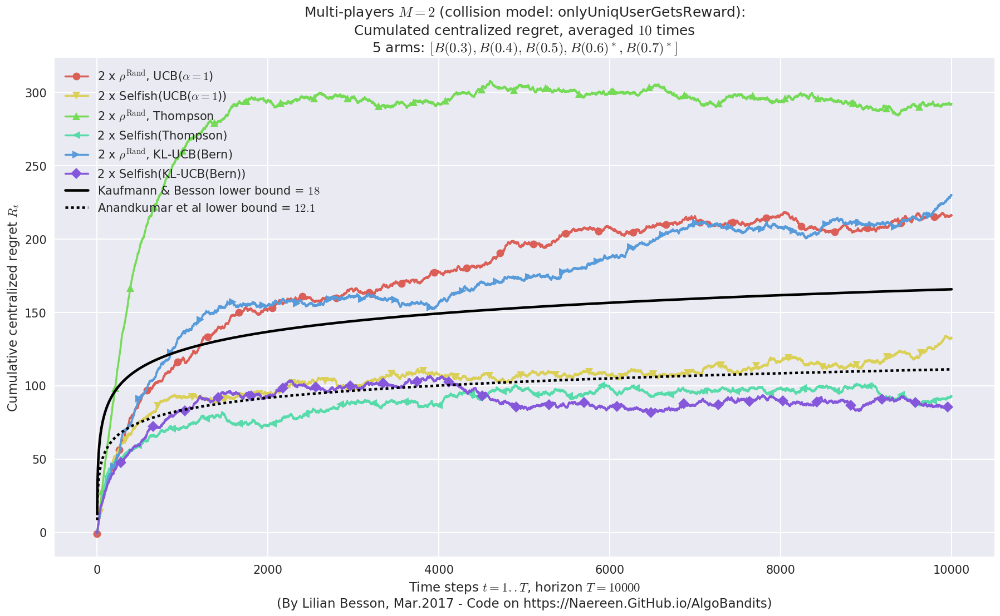

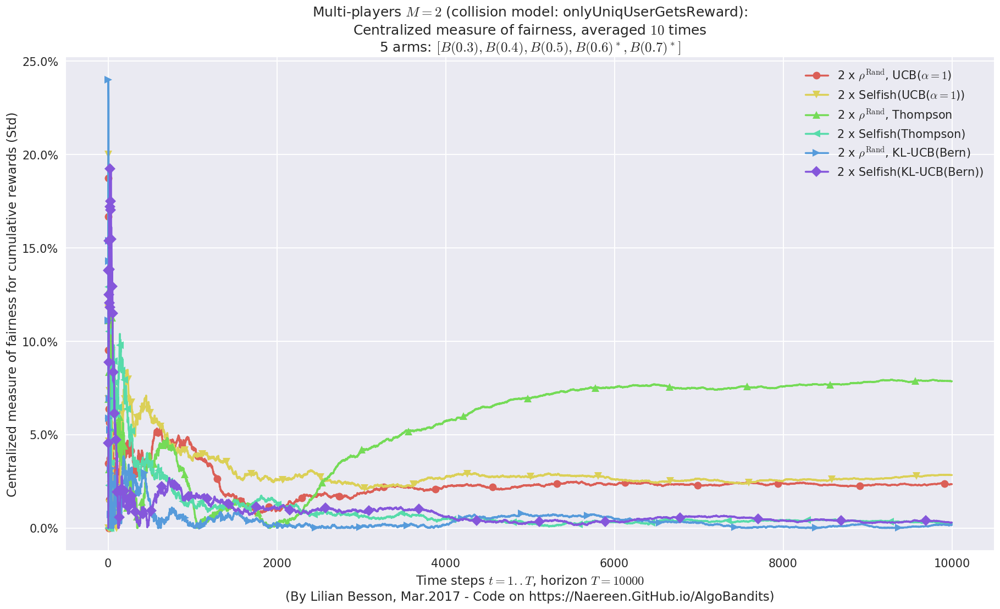

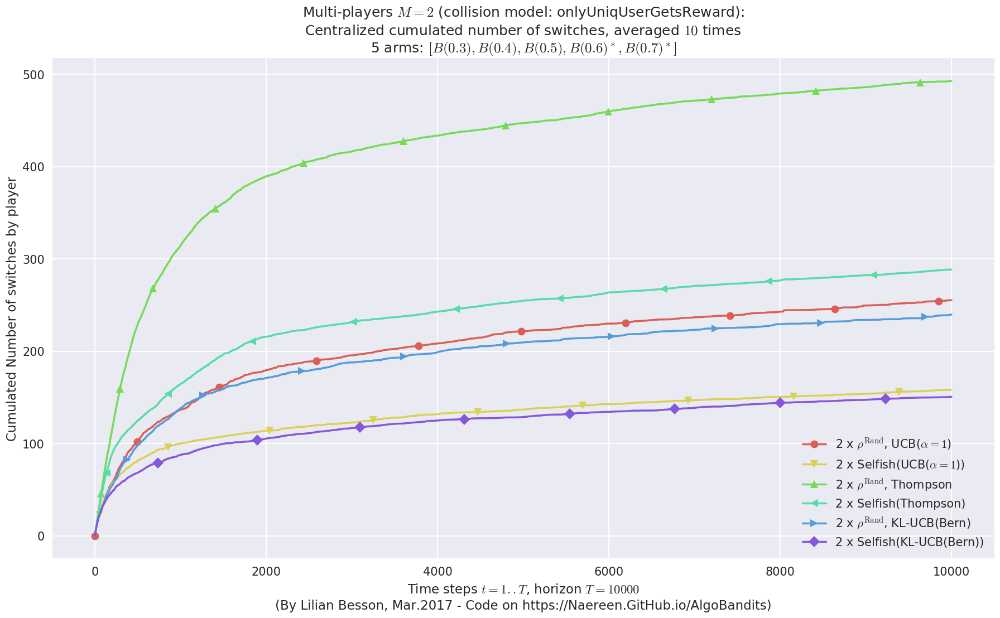

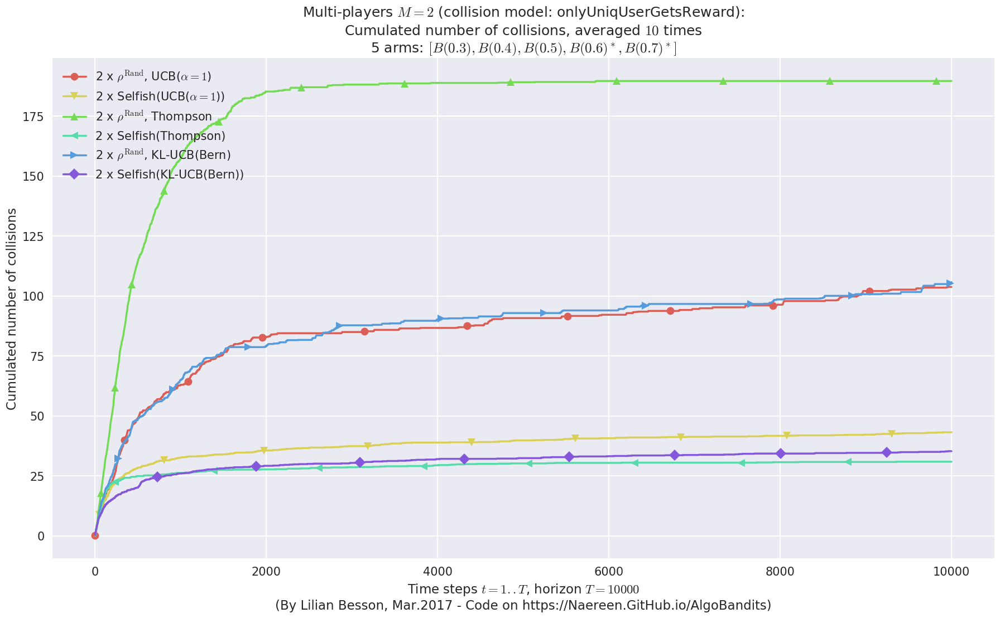

  - For 2 player, our lower bound gave = 8.46 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 5.35 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 3.12 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 40.00% ...
 - Our lowerbound = 8.46,
 - [Anandkumar et al] lowerbound = 5.35


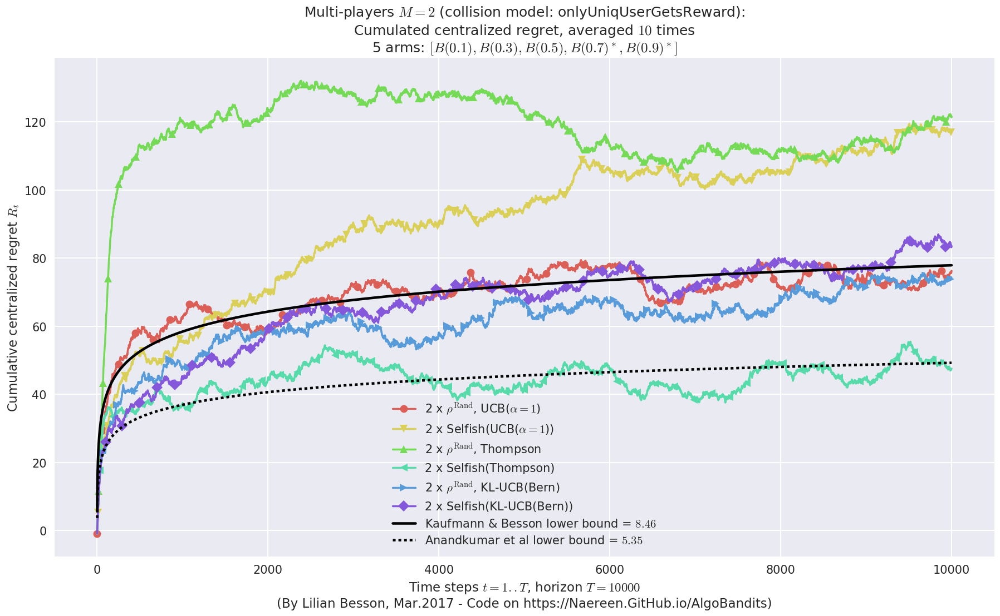

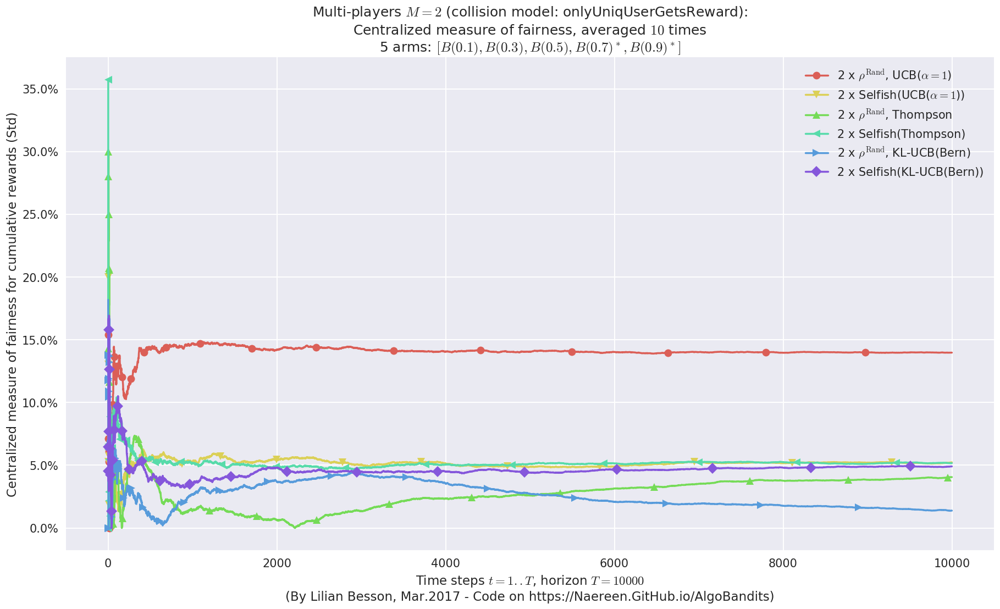

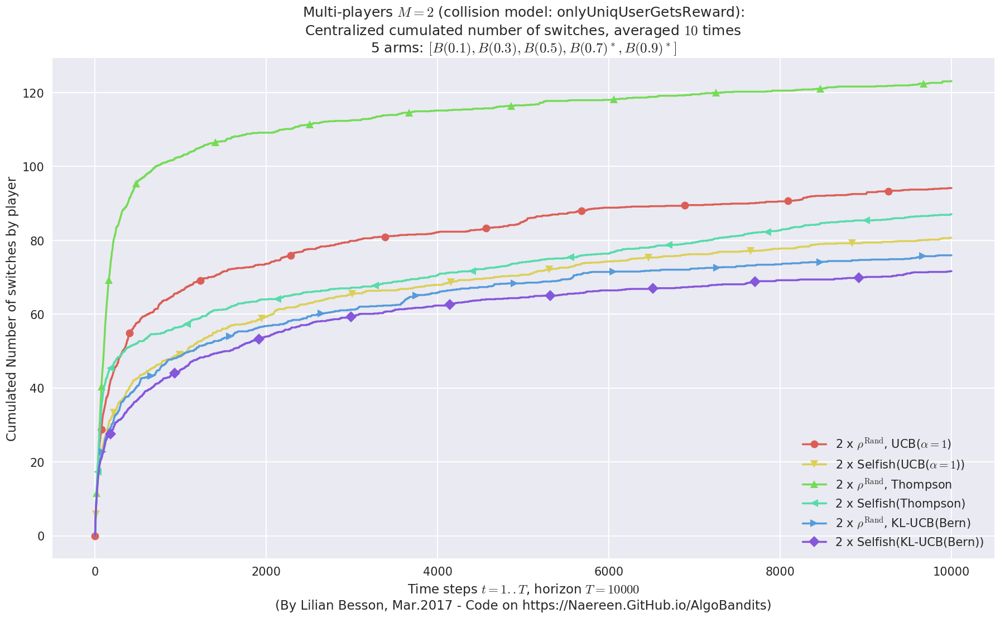

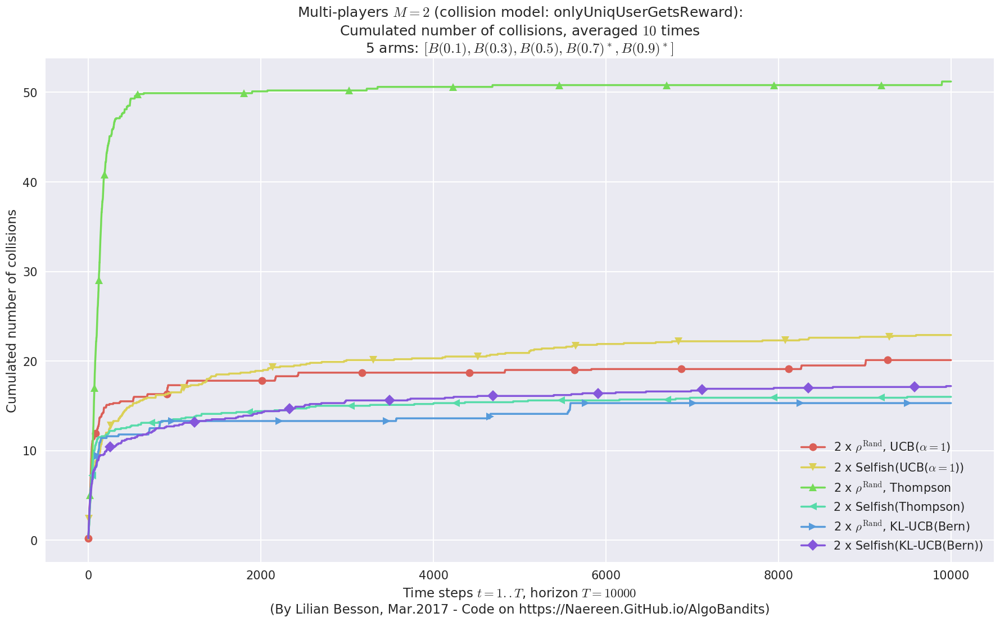

  - For 2 player, our lower bound gave = 2.83 ...
  - For 2 player, the initial lower bound in Theorem 6 from [Anandkumar et al., 2010] gave = 2.78 ...

This MAB problem has: 
 - a [Lai & Robbins] complexity constant C(mu) = 27.3 for 1-player problem ... 
 - a Optimal Arm Identification factor H_OI(mu) = 29.40% ...
 - Our lowerbound = 2.83,
 - [Anandkumar et al] lowerbound = 2.78


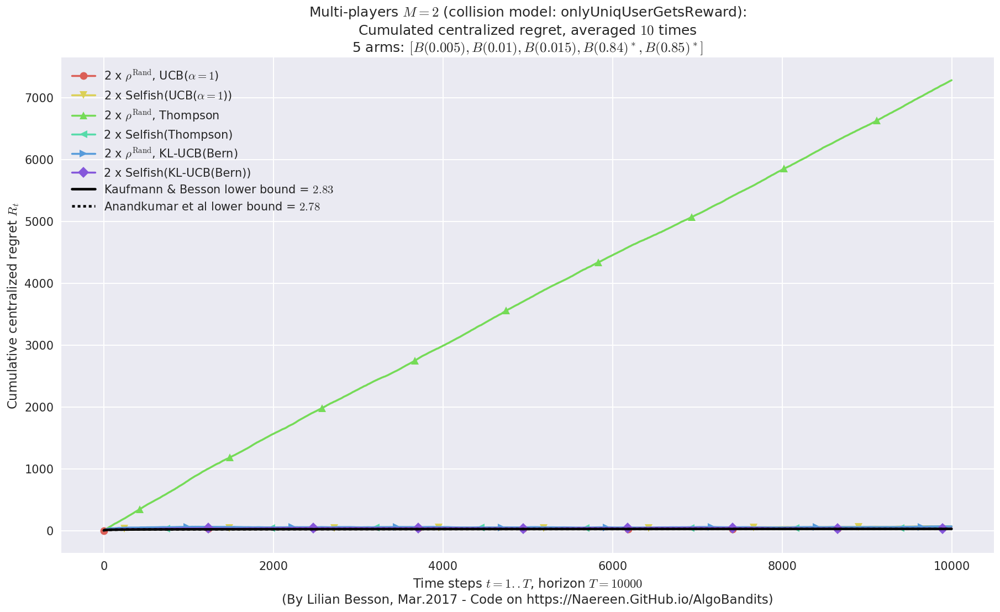

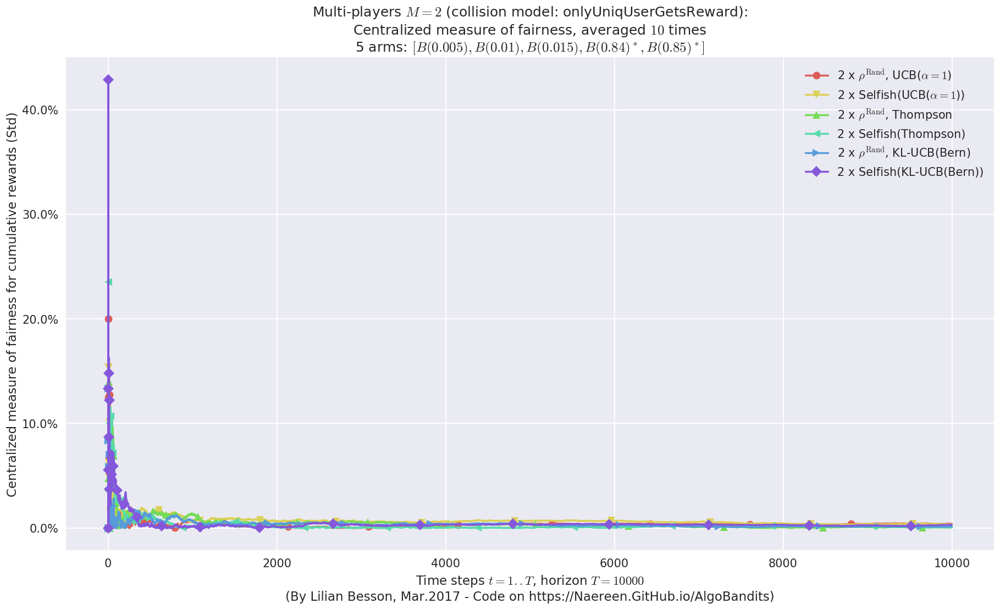

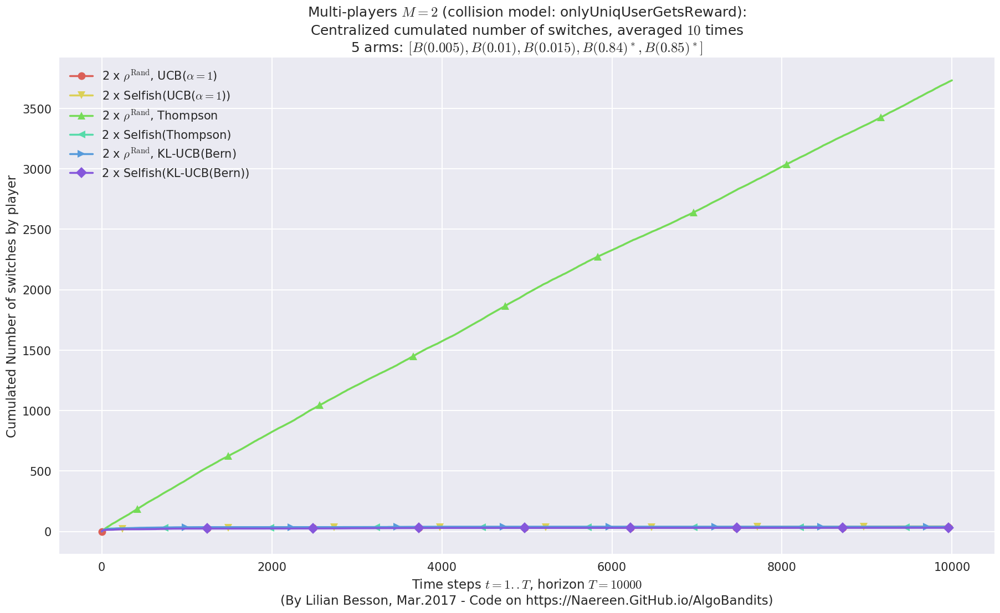

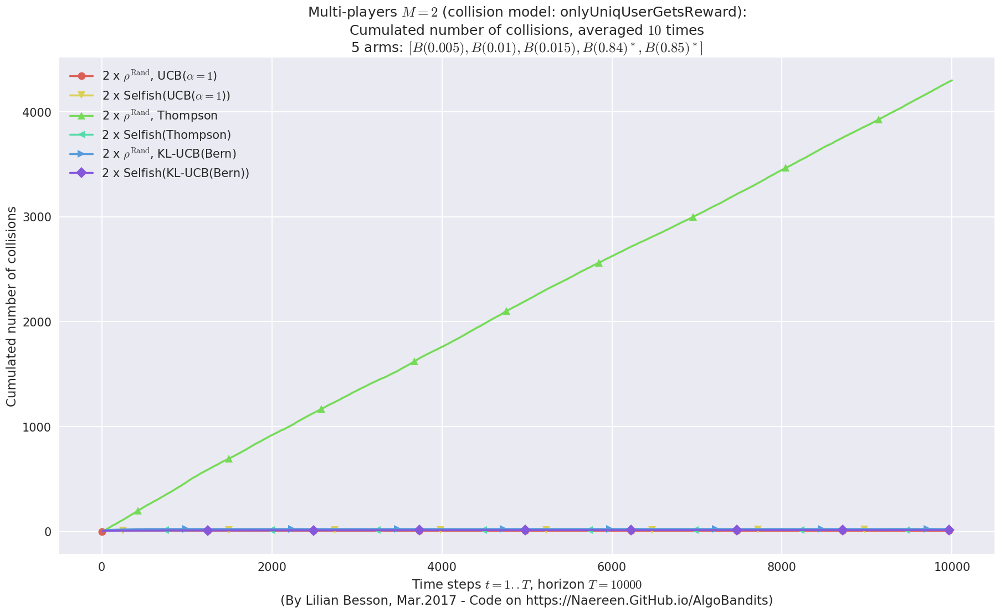

In [21]:
 N = len(configuration["environment"])
for envId, env in enumerate(configuration["environment"]):
    e0, eothers = evaluators[envId][0], evaluators[envId][1:]
    plotCombined(e0, eothers, envId)

---
> That's it for this demo!